<a href="https://www.kaggle.com/code/kedhareswernaidu/eda-on-video-games-sales?scriptVersionId=227417465" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<h1 style="text-align:center; color:#1e90ff;">Game On! Exploring Global Video Game Sales</h1>

<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); border: 2px solid #FF4500; border-radius: 15px; padding: 15px; text-align: center; font-family: 'Courier New', monospace; color: #FFDD00; box-shadow: 0px 0px 20px #FF4500;"> <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;"> 🎮 [Level 1: Importing Libraries] </h2> <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;"> Powering Up... Loading Your Tools ⚙️⚡ </p> </div>

In [92]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

from scipy.stats import ttest_ind, f_oneway
from sklearn.decomposition import PCA
from scipy.stats import chi2_contingency

from IPython.core.display import HTML

import io
from IPython.core.display import HTML

import warnings
warnings.filterwarnings('ignore')

In [7]:
## loading the dataset
df =pd.read_csv('/kaggle/input/videogamesales/vgsales.csv')

In [20]:
# Convert the DataFrame into a more stylish HTML table with cohesive colors
def style_dataframe(df):
    df_limited = df.head(5)  # Limit to the top 5 rows

    return HTML(
        f"""
        <div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
                    border: 3px solid #FF4500; 
                    border-radius: 15px; 
                    padding: 20px; 
                    box-shadow: 0px 0px 25px #FF4500;">
            <h2 style="color: #FF4500; text-align: center; font-family: 'Courier New', monospace; 
                        text-shadow: 4px 4px #000; margin-bottom: 15px;">
                🎮 Data Preview: Top 5 Rows 📊
            </h2>
            <table style="width: 100%; border-collapse: collapse; font-family: 'Courier New', monospace; 
                          background-color: #302b63; color: #FFD700;">
                <thead>
                    <tr style="background-color: #24243e; color: #FFDD00; font-weight: bold; text-align: center;">
                        {''.join(f"<th style='padding: 10px; border: 1px solid #FF4500;'>{col}</th>" for col in df.columns)}
                    </tr>
                </thead>
                <tbody>
                    {"".join(
                        f"<tr style='text-align: center; "
                        f"{'background-color: #0f0c29;' if i % 2 == 0 else 'background-color: #24243e;'}'>"
                        + "".join(f"<td style='padding: 8px; border: 1px solid #FF4500; color: #FFFFFF;'>{val}</td>" for val in row)
                        + "</tr>"
                        for i, row in enumerate(df_limited.values)
                    )}
                </tbody>
            </table>
        </div>
        """
    )

style_dataframe(df)

Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.0
5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.0,31.37


<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); border: 2px solid #FF4500; border-radius: 15px; padding: 15px; text-align: center; font-family: 'Courier New', monospace; color: #FFDD00; box-shadow: 0px 0px 20px #FF4500;"> <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;"> 🎮 [Level 2: Data Understanding] </h2> <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
    Delving deep into the game's hidden levels—uncovering data treasures! 🕵️‍♂️💎
</p> </div>

In [28]:
def style_shape_output(df):
    rows, cols = df.shape  # Get the number of rows and columns
    return HTML(
        f"""
        <div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
                    border: 2px solid #FF4500; 
                    border-radius: 15px; 
                    padding: 15px; 
                    text-align: center; 
                    font-family: 'Courier New', monospace; 
                    color: #FFDD00; 
                    box-shadow: 0px 0px 20px #FF4500;">
            <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
                📊 Dataset Dimensions
            </h2>
            <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
                This dataset contains <strong style="color: #FFDD00;">{rows}</strong> rows and 
                <strong style="color: #FFDD00;">{cols}</strong> columns.
            </p>
        </div>
        """
    )

style_shape_output(df)

In [36]:
# Importing necessary libraries
import io
from IPython.core.display import HTML

# Function to style the output of df.info()
def style_df_info(df):
    # Capture the output of df.info() into a buffer
    buffer = io.StringIO()
    df.info(buf=buffer)  # Redirect the df.info() output to the buffer
    info_output = buffer.getvalue()  # Get the buffer content as a string
    
    # Generate styled HTML output
    return HTML(
        f"""
        <div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
                    border: 2px solid #FF4500; 
                    border-radius: 15px; 
                    padding: 20px; 
                    text-align: left; 
                    font-family: 'Courier New', monospace; 
                    color: #FFDD00; 
                    box-shadow: 0px 0px 20px #FF4500;">
            <h2 style="color: #FF4500; text-align: center; text-shadow: 3px 3px #000;">
                🧩 Data Summary: Info
            </h2>
            <pre style="color: #FFFFFF; font-size: 16px; padding: 10px; line-height: 1.5; background-color: #24243e; border-radius: 10px;">
{info_output}
            </pre>
        </div>
        """
    )


# Call the function to display the styled DataFrame info
style_df_info(df)

In [38]:
# Function to style the output of Year value counts
def style_value_counts(df, column):
    value_counts = df[column].value_counts()  # Calculate value counts
    # Convert value counts to a DataFrame for easier HTML formatting
    value_counts_df = value_counts.reset_index()
    value_counts_df.columns = [f"{column} (Year)", "Count"]

    # Generate styled HTML for value counts
    return HTML(
        f"""
        <div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
                    border: 3px solid #FF4500; 
                    border-radius: 15px; 
                    padding: 20px; 
                    box-shadow: 0px 0px 25px #FF4500;">
            <h2 style="color: #FF4500; text-align: center; font-family: 'Courier New', monospace; 
                        text-shadow: 4px 4px #000;">
                📅 Year-wise Data Distribution
            </h2>
            <table style="width: 100%; border-collapse: collapse; font-family: 'Courier New', monospace; 
                          background-color: #24243e; color: #FFD700;">
                <thead>
                    <tr style="background-color: #302b63; color: #FF4500; font-weight: bold; text-align: center;">
                        <th style="padding: 10px; border: 1px solid #FF4500;">Year</th>
                        <th style="padding: 10px; border: 1px solid #FF4500;">Count</th>
                    </tr>
                </thead>
                <tbody>
                    {"".join(
                        f"<tr style='text-align: center; background-color: #0f0c29;' if i % 2 == 0 else ''>"
                        + f"<td style='padding: 8px; border: 1px solid #FF4500; color: #FFFFFF;'>{row[0]}</td>"
                        + f"<td style='padding: 8px; border: 1px solid #FF4500; color: #FFFFFF;'>{row[1]}</td>"
                        + "</tr>"
                        for i, row in enumerate(value_counts_df.values)
                    )}
                </tbody>
            </table>
        </div>
        """
    )
style_value_counts(df, 'Year')

Year,Count
2009.0,1431.0
2008.0,1428.0
2010.0,1259.0
2007.0,1202.0
2011.0,1139.0
2006.0,1008.0
2005.0,941.0
2002.0,829.0
2003.0,775.0
2004.0,763.0


In [40]:
# Function to style the output of Platform value counts
def style_value_counts(df, column):
    value_counts = df[column].value_counts()  # Calculate value counts
    # Convert value counts to a DataFrame for easier HTML formatting
    value_counts_df = value_counts.reset_index()
    value_counts_df.columns = [f"{column}", "Count"]

    # Generate styled HTML for value counts
    return HTML(
        f"""
        <div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
                    border: 3px solid #FF4500; 
                    border-radius: 15px; 
                    padding: 20px; 
                    box-shadow: 0px 0px 25px #FF4500;">
            <h2 style="color: #FF4500; text-align: center; font-family: 'Courier New', monospace; 
                        text-shadow: 4px 4px #000;">
                🎮 Platform-wise Data Distribution
            </h2>
            <table style="width: 100%; border-collapse: collapse; font-family: 'Courier New', monospace; 
                          background-color: #24243e; color: #FFD700;">
                <thead>
                    <tr style="background-color: #302b63; color: #FF4500; font-weight: bold; text-align: center;">
                        <th style="padding: 10px; border: 1px solid #FF4500;">Platform</th>
                        <th style="padding: 10px; border: 1px solid #FF4500;">Count</th>
                    </tr>
                </thead>
                <tbody>
                    {"".join(
                        f"<tr style='text-align: center; background-color: #0f0c29;' if i % 2 == 0 else ''>"
                        + f"<td style='padding: 8px; border: 1px solid #FF4500; color: #FFFFFF;'>{row[0]}</td>"
                        + f"<td style='padding: 8px; border: 1px solid #FF4500; color: #FFFFFF;'>{row[1]}</td>"
                        + "</tr>"
                        for i, row in enumerate(value_counts_df.values)
                    )}
                </tbody>
            </table>
        </div>
        """
    )

style_value_counts(df, 'Platform')

Platform,Count
DS,2163
PS2,2161
PS3,1329
Wii,1325
X360,1265
PSP,1213
PS,1196
PC,960
XB,824
GBA,822


<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 3px solid #FF4500; 
            border-radius: 15px; 
            padding: 20px; 
            color: #FFD700; 
            font-family: 'Courier New', monospace; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-align: center; text-shadow: 3px 3px 0px #000;">
        📝 Information of Columns
    </h2>
    <ul style="color: #FFFFFF; font-size: 16px; line-height: 1.8; margin-left: 20px;">
        <li><strong style="color: #FFD700;">Rank:</strong> Depicts the video game which is having the highest overall sales.</li>
        <li><strong style="color: #FFD700;">Name:</strong> Names of the Video Games.</li>
        <li><strong style="color: #FFD700;">Platform:</strong> The platform on which the Video Game is supported.</li>
        <li><strong style="color: #FFD700;">Year:</strong> The year in which the video game was released.</li>
        <li><strong style="color: #FFD700;">Genre:</strong> The most widely used game classifying system categorizes games into eight genres: 
            <em>action, adventure, fighting, puzzle, role-playing, simulation, sports, and strategy</em>.</li>
        <li><strong style="color: #FFD700;">Publisher:</strong> The company which released the game.</li>
        <li><strong style="color: #FFD700;">NA_Sales:</strong> Sales of the Video Game recorded in North America.</li>
        <li><strong style="color: #FFD700;">EU_Sales:</strong> Sales of the Video Game recorded in Europe.</li>
        <li><strong style="color: #FFD700;">JP_Sales:</strong> Sales of the Video Game recorded in Japan.</li>
        <li><strong style="color: #FFD700;">Other_Sales:</strong> Sales of the Video Game recorded in every other country except NA, EU, and JP.</li>
        <li><strong style="color: #FFD700;">Global_Sales:</strong> Total sales of the Video Game recorded worldwide.</li>
    </ul>
</div>

<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 3px solid #FF4500; 
            border-radius: 15px; 
            padding: 20px; 
            color: #FFD700; 
            font-family: 'Courier New', monospace; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-align: center; text-shadow: 3px 3px 0px #000;">
        🎮 Important Information about Gaming Platforms
    </h2>
    <ul style="color: #FFFFFF; font-size: 16px; line-height: 1.8; margin-left: 20px;">
        <li><strong style="color: #FFD700;">WS:</strong> The WonderSwan is a handheld game console released in Japan by Bandai, developed by Gunpei Yokoi's company Koto Laboratory.</li>
        <li><strong style="color: #FFD700;">3DO:</strong> The 3DO Interactive Multiplayer is a home video game console developed by The 3DO Company.</li>
        <li><strong style="color: #FFD700;">DC:</strong> Sega's Dreamcast, featuring Internet gaming and built-in modem, was the first console of its generation.</li>
        <li><strong style="color: #FFD700;">SAT:</strong> The Sega Saturn, a home video game console by Sega, was released on November 22, 1994.</li>
        <li><strong style="color: #FFD700;">SCD:</strong> The Sega CD plays CD-based games and adds faster processing and graphical enhancements.</li>
        <li><strong style="color: #FFD700;">2600:</strong> The Atari 2600, launched in September 1977, is a home video game console developed by Atari, Inc.</li>
        <li><strong style="color: #FFD700;">PS:</strong> PlayStation Network offers gaming, subscription services, streaming, and marketplace features.</li>
        <li><strong style="color: #FFD700;">PSP:</strong> The PlayStation Portable is a handheld console developed by Sony Interactive Entertainment.</li>
        <li><strong style="color: #FFD700;">PCFX:</strong> The PC-FX is a 32-bit home video game console released in 1994 by NEC and Hudson Soft.</li>
        <li><strong style="color: #FFD700;">PS2:</strong> The PlayStation 2 is a home video game console developed by Sony Interactive Entertainment.</li>
        <li><strong style="color: #FFD700;">PSV:</strong> The PlayStation Vita is a handheld console developed by Sony Interactive Entertainment.</li>
        <li><strong style="color: #FFD700;">PS3:</strong> The PlayStation 3 is a home console developed by Sony, succeeding the PS2 in the PlayStation lineup.</li>
        <li><strong style="color: #FFD700;">TG16:</strong> The TurboGrafx-16, known as PC Engine outside North America, is a home console by Hudson Soft and NEC.</li>
        <li><strong style="color: #FFD700;">PS4:</strong> The PlayStation 4 is the successor to the PS3, developed by Sony Interactive Entertainment.</li>
        <li><strong style="color: #FFD700;">PC:</strong> PC games are electronic games played on personal computers.</li>
        <li><strong style="color: #FFD700;">N64:</strong> The Nintendo 64 is a home video game console developed by Nintendo.</li>
        <li><strong style="color: #FFD700;">GB:</strong> The Game Boy is an 8-bit fourth-generation handheld game console by Nintendo.</li>
        <li><strong style="color: #FFD700;">Wii:</strong> The Wii is a home video game console developed and marketed by Nintendo.</li>
        <li><strong style="color: #FFD700;">WiiU:</strong> The Wii U is the successor to the Wii, developed by Nintendo for simulation games.</li>
        <li><strong style="color: #FFD700;">DS:</strong> The Nintendo DS is a handheld console known for its dual-screen feature, released between 2004 and 2005.</li>
        <li><strong style="color: #FFD700;">3DS:</strong> The Nintendo 3DS is a handheld console released in 2010, succeeding the DS.</li>
        <li><strong style="color: #FFD700;">NES:</strong> The NES is known for groundbreaking titles like Super Mario Bros. and The Legend of Zelda.</li>
        <li><strong style="color: #FFD700;">SNES:</strong> The Super Nintendo Entertainment System is a 16-bit home console by Nintendo.</li>
        <li><strong style="color: #FFD700;">GC:</strong> The Nintendo GameCube is a home video game console developed by Nintendo.</li>
        <li><strong style="color: #FFD700;">GBA:</strong> The Game Boy Advance is a 32-bit handheld console succeeding the Game Boy Color.</li>
        <li><strong style="color: #FFD700;">XB:</strong> The Xbox, by Microsoft, is the first installment in the Xbox series of consoles.</li>
        <li><strong style="color: #FFD700;">XONE:</strong> The Xbox One, developed by Microsoft, was announced in May 2013.</li>
        <li><strong style="color: #FFD700;">X360:</strong> The Xbox 360 is the second console in Microsoft's Xbox series.</li>
        <li><strong style="color: #FFD700;">GG:</strong> Guilty Gear is a 2D fighting game developed by Team Neo Blood.</li>
    </ul>
</div>

<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        🛠️ [Level 3: Data Cleaning]
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
        Tidying up the dataset for smooth gameplay—polishing data for a perfect run! 🧹✨
    </p>
</div>

In [55]:
# Function to style the output of Null Values
def style_null_values(df):
    # Compute null values
    null_counts = df.isnull().sum()
    null_df = null_counts[null_counts > 0].reset_index()
    null_df.columns = ['Column Name', 'Null Count']

    # Generate styled HTML
    return HTML(
        f"""
        <div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
                    border: 2px solid #FF4500; 
                    border-radius: 15px; 
                    padding: 20px; 
                    box-shadow: 0px 0px 20px #FF4500;">
            <h2 style="color: #FF4500; text-align: center; font-family: 'Courier New', monospace; 
                        text-shadow: 3px 3px 0px #000;">
                🕵️‍♂️ Finding the Null Values
            </h2>
            <table style="width: 100%; border-collapse: collapse; font-family: 'Courier New', monospace; 
                          background-color: #24243e; color: #FFD700;">
                <thead>
                    <tr style="background-color: #302b63; color: #FF4500; font-weight: bold; text-align: center;">
                        <th style="padding: 10px; border: 1px solid #FF4500;">Column Name</th>
                        <th style="padding: 10px; border: 1px solid #FF4500;">Null Count</th>
                    </tr>
                </thead>
                <tbody>
                    {"".join(
                        f"<tr style='text-align: center; background-color: #0f0c29;' if i % 2 == 0 else ''>"
                        + f"<td style='padding: 8px; border: 1px solid #FF4500; color: #FFFFFF;'>{row[0]}</td>"
                        + f"<td style='padding: 8px; border: 1px solid #FF4500; color: #FFFFFF;'>{row[1]}</td>"
                        + "</tr>"
                        for i, row in enumerate(null_df.values)
                    )}
                </tbody>
            </table>
        </div>
        """
    )

style_null_values(df)

Column Name,Null Count
Year,271
Publisher,58


In [49]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_table = pd.DataFrame({'column_name': df.columns,
                              'percent_missing': percent_missing})

missing_table

,column_name,percent_missing
Rank,Rank,0.000000
Name,Name,0.000000
Platform,Platform,0.000000
Year,Year,1.632727
Genre,Genre,0.000000
Publisher,Publisher,0.349440
NA_Sales,NA_Sales,0.000000
EU_Sales,EU_Sales,0.000000
JP_Sales,JP_Sales,0.000000
Other_Sales,Other_Sales,0.000000


In [51]:
##Display of Null valued rows
null_mask = df.isnull()

null_rows = df[null_mask.any(axis=1)]

ds = pd.DataFrame(null_rows)

ds.head(10)

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
179,180,Madden NFL 2004,PS2,NaN,Sports,Electronic Arts,4.26,0.26,0.01,0.71,5.23
377,378,FIFA Soccer 2004,PS2,NaN,Sports,Electronic Arts,0.59,2.36,0.04,0.51,3.49
431,432,LEGO Batman: The Videogame,Wii,NaN,Action,Warner Bros. Interactive Entertainment,1.86,1.02,0.00,0.29,3.17
470,471,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,NaN,1.57,1.02,0.00,0.41,3.00
607,608,Space Invaders,2600,NaN,Shooter,Atari,2.36,0.14,0.00,0.03,2.53
624,625,Rock Band,X360,NaN,Misc,Electronic Arts,1.93,0.34,0.00,0.21,2.48
649,650,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,Konami Digital Entertainment,2.15,0.18,0.00,0.07,2.39
652,653,LEGO Indiana Jones: The Original Adventures,Wii,NaN,Action,LucasArts,1.54,0.63,0.00,0.22,2.39
711,713,Call of Duty 3,Wii,NaN,Shooter,Activision,1.19,0.84,0.00,0.23,2.26
782,784,Rock Band,Wii,NaN,Misc,MTV Games,1.35,0.56,0.00,0.20,2.11


In [57]:
## Replacing the null values in Year using median
median_value = df['Year'].median()

df['Year'].fillna(median_value, inplace=True)

median_value

2007.0

In [59]:
## Replacing the null values in Publisher using mode
mode_value = df['Publisher'].mode()[0]

df['Publisher'].fillna(mode_value, inplace=True)

print(mode_value)

Electronic Arts


In [61]:
## Finding the Null Values
df.isnull().sum()

Rank            0
Name            0
Platform        0
Year            0
Genre           0
Publisher       0
NA_Sales        0
EU_Sales        0
JP_Sales        0
Other_Sales     0
Global_Sales    0
dtype: int64

In [63]:
# Check for duplicates in the "Name" column
name_duplicates = df['Rank'].duplicated()

# Print the result
print(f"Are there any duplicates in the 'Rank' column? {any(name_duplicates)}")

Are there any duplicates in the 'Rank' column? False


In [65]:
# Check for duplicates in the "Name" column
name_duplicates = df['Name'].duplicated()

# Print the result
print(f"Are there any duplicates in the 'Name' column? {any(name_duplicates)}")

Are there any duplicates in the 'Name' column? True


In [67]:
# Identify rows with duplicate names
duplicate_rows = df[name_duplicates]

# Print the duplicate rows
duplicate_rows.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
23,24,Grand Theft Auto V,X360,2013.0,Action,Take-Two Interactive,9.63,5.31,0.06,1.38,16.38
35,36,Call of Duty: Black Ops II,X360,2012.0,Shooter,Activision,8.25,4.30,0.07,1.12,13.73
37,38,Call of Duty: Modern Warfare 3,PS3,2011.0,Shooter,Activision,5.54,5.82,0.49,1.62,13.46
40,41,Call of Duty: Black Ops,PS3,2010.0,Shooter,Activision,5.98,4.44,0.48,1.83,12.73
44,45,Grand Theft Auto V,PS4,2014.0,Action,Take-Two Interactive,3.80,5.81,0.36,2.02,11.98


In [69]:
# Filter the DataFrame to find rows containing "Grand Theft Auto V" in the "Name" column
gta_rows = df[df['Name'].str.contains('Grand Theft Auto V')]

# Print the filtered DataFrame
gta_rows.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
16,17,Grand Theft Auto V,PS3,2013.0,Action,Take-Two Interactive,7.01,9.27,0.97,4.14,21.40
23,24,Grand Theft Auto V,X360,2013.0,Action,Take-Two Interactive,9.63,5.31,0.06,1.38,16.38
44,45,Grand Theft Auto V,PS4,2014.0,Action,Take-Two Interactive,3.80,5.81,0.36,2.02,11.98
197,198,Grand Theft Auto V,XOne,2014.0,Action,Take-Two Interactive,2.66,2.01,0.00,0.41,5.08
617,618,Rockstar Games Double Pack: Grand Theft Auto I...,XB,2003.0,Action,Take-Two Interactive,1.84,0.56,0.00,0.09,2.49


<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        📊 [Level 4: Data Visualization]
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
        Harnessing the power of visuals to uncover hidden patterns and insights! 🌟📈
    </p>
</div>

In [72]:
df.Genre.value_counts()

Genre
Action          3316
Sports          2346
Misc            1739
Role-Playing    1488
Shooter         1310
Adventure       1286
Racing          1249
Platform         886
Simulation       867
Fighting         848
Strategy         681
Puzzle           582
Name: count, dtype: int64

In [74]:
genre_counts = df['Genre'].value_counts()
genre_percentages = (genre_counts / len(df)) * 100
genre_percentages

Genre
Action          19.978311
Sports          14.134233
Misc            10.477166
Role-Playing     8.964936
Shooter          7.892517
Adventure        7.747921
Racing           7.525003
Platform         5.337993
Simulation       5.223521
Fighting         5.109049
Strategy         4.102904
Puzzle           3.506447
Name: count, dtype: float64

In [76]:
df.Rank.value_counts()

Rank
1        1
11089    1
11059    1
11060    1
11061    1
        ..
5539     1
5540     1
5541     1
5542     1
16600    1
Name: count, Length: 16598, dtype: int64

In [78]:
df.Year.value_counts()

Year
2007.0    1473
2009.0    1431
2008.0    1428
2010.0    1259
2011.0    1139
2006.0    1008
2005.0     941
2002.0     829
2003.0     775
2004.0     763
2012.0     657
2015.0     614
2014.0     582
2013.0     546
2001.0     482
1998.0     379
2000.0     349
2016.0     344
1999.0     338
1997.0     289
1996.0     263
1995.0     219
1994.0     121
1993.0      60
1981.0      46
1992.0      43
1991.0      41
1982.0      36
1986.0      21
1989.0      17
1983.0      17
1990.0      16
1987.0      16
1988.0      15
1985.0      14
1984.0      14
1980.0       9
2017.0       3
2020.0       1
Name: count, dtype: int64

In [80]:
df.Publisher.value_counts()

Publisher
Electronic Arts                 1409
Activision                       975
Namco Bandai Games               932
Ubisoft                          921
Konami Digital Entertainment     832
                                ... 
Warp                               1
New                                1
Elite                              1
Evolution Games                    1
UIG Entertainment                  1
Name: count, Length: 578, dtype: int64

In [82]:
df.Platform.value_counts()

Platform
DS      2163
PS2     2161
PS3     1329
Wii     1325
X360    1265
PSP     1213
PS      1196
PC       960
XB       824
GBA      822
GC       556
3DS      509
PSV      413
PS4      336
N64      319
SNES     239
XOne     213
SAT      173
WiiU     143
2600     133
NES       98
GB        98
DC        52
GEN       27
NG        12
SCD        6
WS         6
3DO        3
TG16       2
GG         1
PCFX       1
Name: count, dtype: int64

<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        📊 [Level 4.1: Univariate Analysis]
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
        Analyzing individual variables to gain insights into their distributions and hidden patterns! 🌟📈
    </p>
</div>

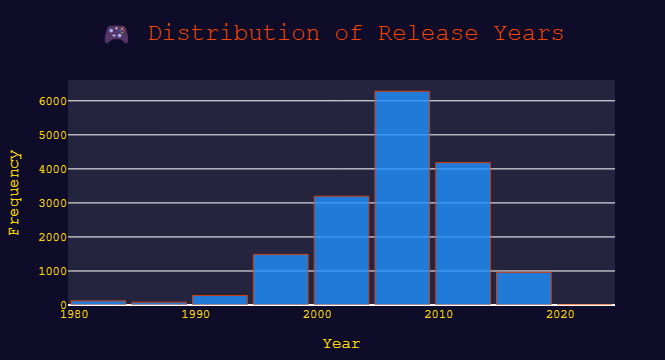

In [94]:
# Create the histogram using Plotly
fig = go.Figure()

# Add histogram trace
fig.add_trace(go.Histogram(
    x=df['Year'],
    xbins=dict(size=5),  # Bin width of 5 years for a cleaner look
    marker=dict(color='#1e90ff', line=dict(color='#FF4500', width=1)),  # Blue bars with orange edges
    opacity=0.8  # Slightly transparent for a sleek effect
))

# Update layout for gaming theme
fig.update_layout(
    title=dict(
        text='🎮 Distribution of Release Years',
        font=dict(size=24, color='#FF4500'),  # Orange title
        x=0.5  # Center alignment
    ),
    xaxis=dict(
        title=dict(text='Year', font=dict(size=16, color='#FFD700')),  # Yellow label
        tickfont=dict(size=12, color='#FFD700')  # Yellow ticks
    ),
    yaxis=dict(
        title=dict(text='Frequency', font=dict(size=16, color='#FFD700')),  # Yellow label
        tickfont=dict(size=12, color='#FFD700')  # Yellow ticks
    ),
    paper_bgcolor='#0f0c29',  # Deep background color
    plot_bgcolor='#24243e',  # Graph background color
    font=dict(family='Courier New', size=14, color='#FFDD00'),  # Font consistent with the gaming theme
    margin=dict(l=50, r=50, t=80, b=50),  # Set margins for better spacing
    bargap=0.1  # Small gap between bars
)

# Show the figure
fig.show()

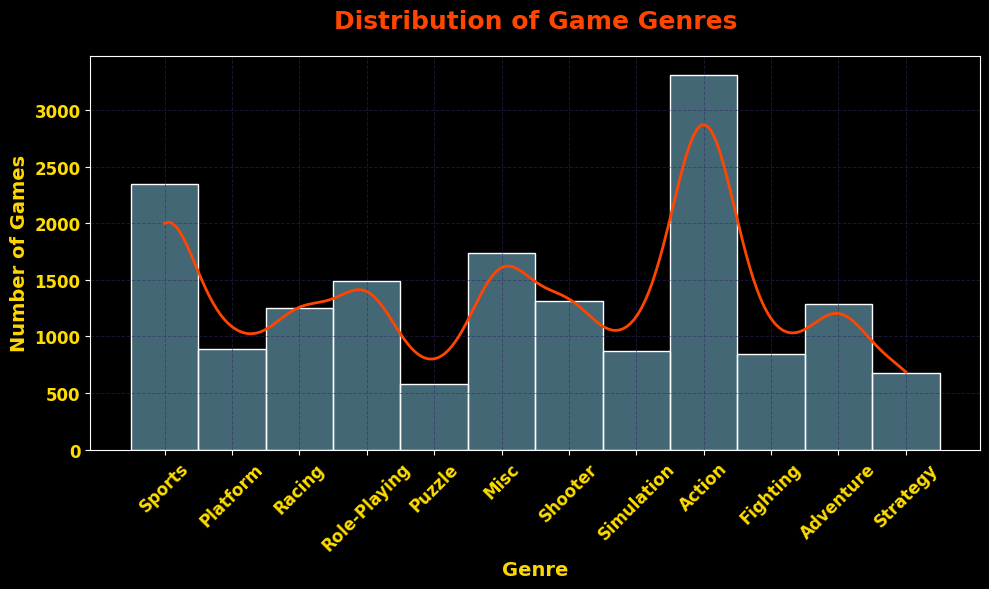

In [106]:
# Set the dark background for a gaming aesthetic
plt.style.use('dark_background')

# Set the figure size
plt.figure(figsize=(10, 6))

# Create the histogram with KDE using Seaborn
sns.histplot(
    data=df,
    x='Genre',
    bins=20,
    kde=True,  # Enable KDE
    color='skyblue',  # Histogram bar color
)

# Customize the KDE curve (using Seaborn's default style without kde_kws)
for line in plt.gca().lines:
    line.set_color('#FF4500')  # Set the KDE curve color to orange
    line.set_linewidth(2)  # Set KDE line thickness

# Add title and axis labels with gaming-themed styling
plt.title('Distribution of Game Genres', fontsize=18, color='#FF4500', fontweight='bold', pad=20)
plt.xlabel('Genre', fontsize=14, color='#FFD700', fontweight='bold')
plt.ylabel('Number of Games', fontsize=14, color='#FFD700', fontweight='bold')

# Rotate the x-ticks for better readability
plt.xticks(fontsize=12, rotation=45, color='#FFDD00', fontweight='bold')  # Golden tick labels
plt.yticks(fontsize=12, color='#FFDD00', fontweight='bold')  # Golden tick labels

# Add gridlines for visual structure
plt.grid(color='#302b63', linestyle='--', linewidth=0.7, alpha=0.5)

# Tighten the layout for clean spacing
plt.tight_layout()

# Display the plot
plt.show()

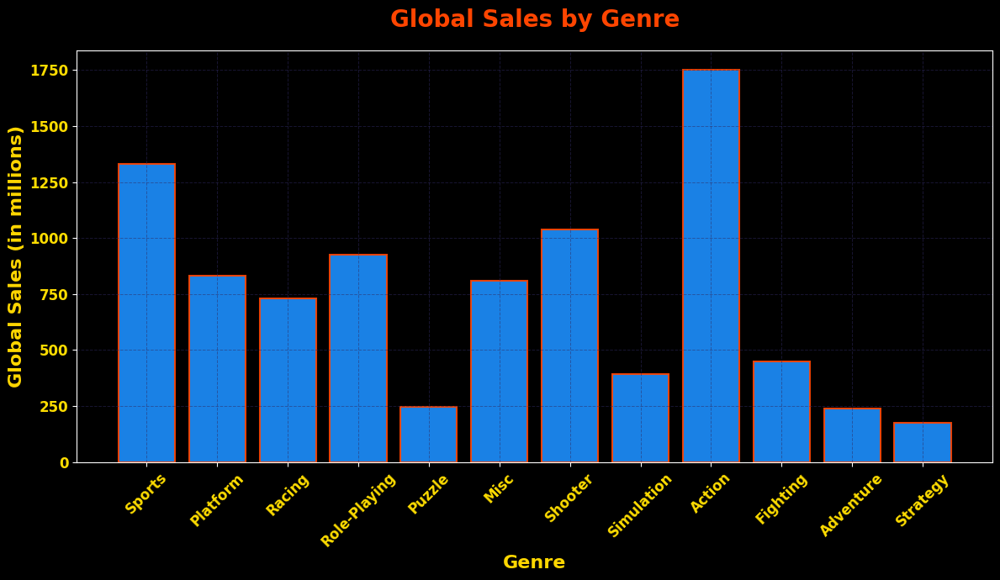

In [108]:
# Set the dark background for a gaming aesthetic
plt.style.use('dark_background')

# Set the figure size
plt.figure(figsize=(12, 7))

# Create the histogram for global sales by genre
genres = df["Genre"].unique()
sales_by_genre = [df[df["Genre"] == genre]["Global_Sales"].sum() for genre in genres]

# Plotting
plt.bar(
    genres,
    sales_by_genre,
    color='#1e90ff',  # Bright blue for bars
    edgecolor='#FF4500',  # Neon orange edges
    linewidth=1.5,
    alpha=0.9,  # Slight transparency for a sleek effect
)

# Add title and labels with thematic styling
plt.title('Global Sales by Genre', fontsize=20, color='#FF4500', fontweight='bold', pad=20)
plt.xlabel('Genre', fontsize=16, color='#FFD700', fontweight='bold')
plt.ylabel('Global Sales (in millions)', fontsize=16, color='#FFD700', fontweight='bold')

# Rotate the x-axis labels for better readability
plt.xticks(fontsize=12, rotation=45, color='#FFDD00', fontweight='bold')
plt.yticks(fontsize=12, color='#FFDD00', fontweight='bold')

# Add gridlines for visual enhancement
plt.grid(color='#302b63', linestyle='--', linewidth=0.7, alpha=0.5)

# Improve layout spacing
plt.tight_layout()

# Show the plot
plt.show()

<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        🔗 [Level 4.2: Bivariate Analysis]
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
        Uncovering the relationships between variables—exploring connections and interactions for deeper insights! 🔍📊
    </p>
</div>

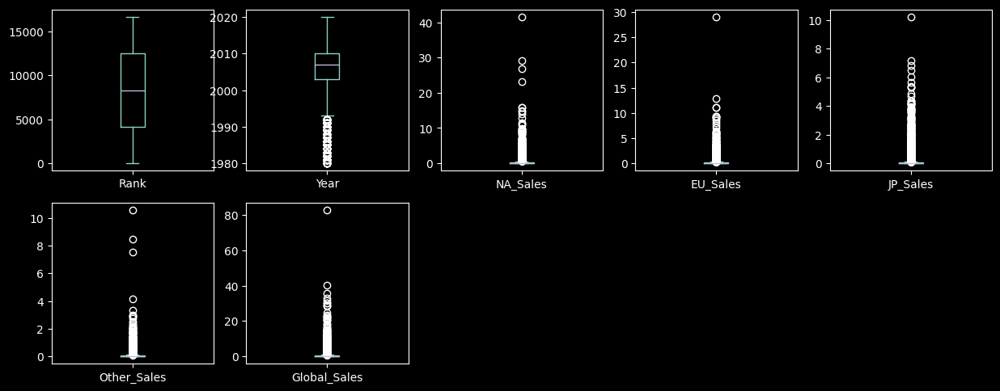

In [121]:
df.plot(kind='box', subplots=True, figsize=(15,15), layout=(5,5))
plt.show()

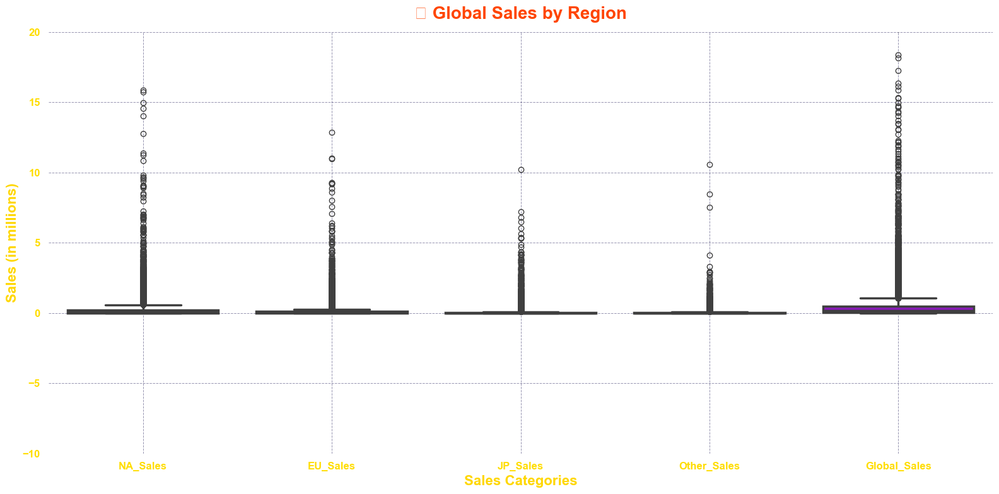

In [128]:
# Filtered DataFrame for sales data
x = df[['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']]

# Set a dark gaming-inspired theme for the plot
sns.set_theme(style="darkgrid", palette="deep")

# Set the figure size
plt.figure(figsize=(16, 8))

# Create a box plot
sns.boxplot(
    data=x,
    linewidth=2.5,
    palette={
        'NA_Sales': '#1e90ff',  # Bright blue
        'EU_Sales': '#FF4500',  # Neon orange
        'JP_Sales': '#FFD700',  # Golden yellow
        'Other_Sales': '#32CD32',  # Lime green
        'Global_Sales': '#9400D3'  # Dark purple
    }
)

# Add plot title and labels with gaming-inspired styling
plt.title('🎮 Global Sales by Region', fontsize=20, color='#FF4500', fontweight='bold', pad=15)
plt.xlabel('Sales Categories', fontsize=16, color='#FFD700', fontweight='bold')
plt.ylabel('Sales (in millions)', fontsize=16, color='#FFD700', fontweight='bold')

# Rotate x-axis labels for better readability
plt.xticks(fontsize=12, color='#FFDD00', fontweight='bold')
plt.yticks(fontsize=12, color='#FFDD00', fontweight='bold')

# Set the y-axis limits to expand the range
plt.ylim(-10, 20)  # Adjust values as required

# Customize gridlines for a polished look
plt.grid(color='#302b63', linestyle='--', linewidth=0.7, alpha=0.5)

# Add additional styling for a clean presentation
plt.gca().set_facecolor('#24243e')  # Dark bluish-gray background for the plot
plt.box(False)  # Remove the box outline for cleaner visuals

# Display the plot
plt.tight_layout()
plt.show()

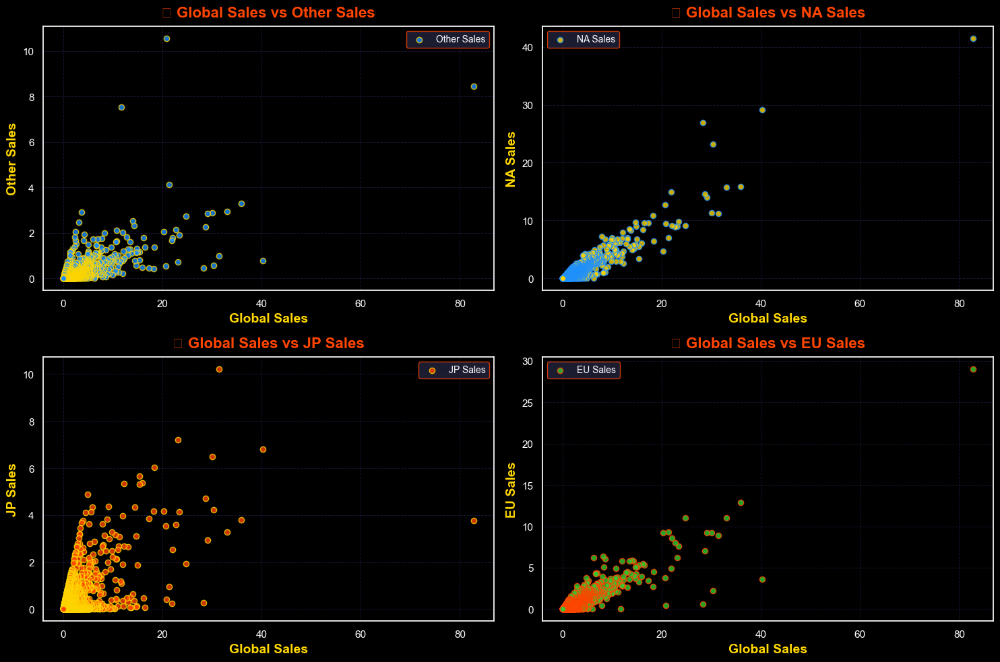

In [130]:
# Set the dark background theme for the gaming aesthetic
plt.style.use('dark_background')

# Set figure size
plt.figure(figsize=(15, 10))

# Scatter plot 1: Global Sales vs Other Sales
plt.subplot(2, 2, 1)
plt.scatter(
    df['Global_Sales'], df['Other_Sales'],
    color='#1e90ff',  # Bright blue points
    label='Other Sales',
    alpha=0.8, edgecolors='#FFD700'  # Yellow edges for a glowing effect
)
plt.xlabel('Global Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.ylabel('Other Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.title('🎮 Global Sales vs Other Sales', fontsize=16, color='#FF4500', fontweight='bold', pad=10)
plt.legend(facecolor='#24243e', edgecolor='#FF4500', fontsize=10)
plt.grid(color='#302b63', linestyle='--', linewidth=0.7, alpha=0.5)

# Scatter plot 2: Global Sales vs NA Sales
plt.subplot(2, 2, 2)
plt.scatter(
    df['Global_Sales'], df['NA_Sales'],
    color='#FFD700',  # Golden yellow points
    label='NA Sales',
    alpha=0.8, edgecolors='#1e90ff'  # Blue edges
)
plt.xlabel('Global Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.ylabel('NA Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.title('🎮 Global Sales vs NA Sales', fontsize=16, color='#FF4500', fontweight='bold', pad=10)
plt.legend(facecolor='#24243e', edgecolor='#FF4500', fontsize=10)
plt.grid(color='#302b63', linestyle='--', linewidth=0.7, alpha=0.5)

# Scatter plot 3: Global Sales vs JP Sales
plt.subplot(2, 2, 3)
plt.scatter(
    df['Global_Sales'], df['JP_Sales'],
    color='#FF4500',  # Neon orange points
    label='JP Sales',
    alpha=0.8, edgecolors='#FFD700'  # Yellow edges
)
plt.xlabel('Global Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.ylabel('JP Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.title('🎮 Global Sales vs JP Sales', fontsize=16, color='#FF4500', fontweight='bold', pad=10)
plt.legend(facecolor='#24243e', edgecolor='#FF4500', fontsize=10)
plt.grid(color='#302b63', linestyle='--', linewidth=0.7, alpha=0.5)

# Scatter plot 4: Global Sales vs EU Sales
plt.subplot(2, 2, 4)
plt.scatter(
    df['Global_Sales'], df['EU_Sales'],
    color='#32CD32',  # Lime green points
    label='EU Sales',
    alpha=0.8, edgecolors='#FF4500'  # Orange edges
)
plt.xlabel('Global Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.ylabel('EU Sales', fontsize=14, color='#FFD700', fontweight='bold')
plt.title('🎮 Global Sales vs EU Sales', fontsize=16, color='#FF4500', fontweight='bold', pad=10)
plt.legend(facecolor='#24243e', edgecolor='#FF4500', fontsize=10)
plt.grid(color='#302b63', linestyle='--', linewidth=0.7, alpha=0.5)

# Adjust the spacing between and around subplots
plt.tight_layout()

# Display the styled scatter plots
plt.show()

In [140]:
# Calculate the correlation coefficient
correlation = df['Global_Sales'].corr(df['NA_Sales'])

# Creating a styled output for the correlation result
display(HTML(f"""
<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        🔗 Correlation Coefficient
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-shadow: 2px 2px 2px #000;">
        Correlation between <strong>Global Sales</strong> and <strong>North America Sales</strong> is: 
        <span style="color: #FFD700; font-size: 20px; font-weight: bold;">{correlation:.2f}</span>
    </p>
</div>
"""))

In [146]:
# Calculate the correlation coefficient
correlation = df['Global_Sales'].corr(df['EU_Sales'])

# Creating a styled output for the correlation result
display(HTML(f"""
<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        🔗 Correlation Coefficient
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-shadow: 2px 2px 2px #000;">
        Correlation between <strong>Global Sales</strong> and <strong>Europe Sales</strong> is: 
        <span style="color: #FFD700; font-size: 20px; font-weight: bold;">{correlation:.2f}</span>
    </p>
</div>
"""))

In [148]:
# Calculate the correlation coefficient
correlation = df['Global_Sales'].corr(df['JP_Sales'])

# Creating a styled output for the correlation result
display(HTML(f"""
<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        🔗 Correlation Coefficient
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-shadow: 2px 2px 2px #000;">
        Correlation between <strong>Global Sales</strong> and <strong>Japan Sales</strong> is: 
        <span style="color: #FFD700; font-size: 20px; font-weight: bold;">{correlation:.2f}</span>
    </p>
</div>
"""))

In [152]:
# Calculate the correlation coefficient
correlation = df['Global_Sales'].corr(df['Other_Sales'])

# Creating a styled output for the correlation result
display(HTML(f"""
<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        🔗 Correlation Coefficient
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-shadow: 2px 2px 2px #000;">
        Correlation between <strong>Global Sales</strong> and <strong>Other Countries Sales</strong> is: 
        <span style="color: #FFD700; font-size: 20px; font-weight: bold;">{correlation:.2f}</span>
    </p>
</div>
"""))

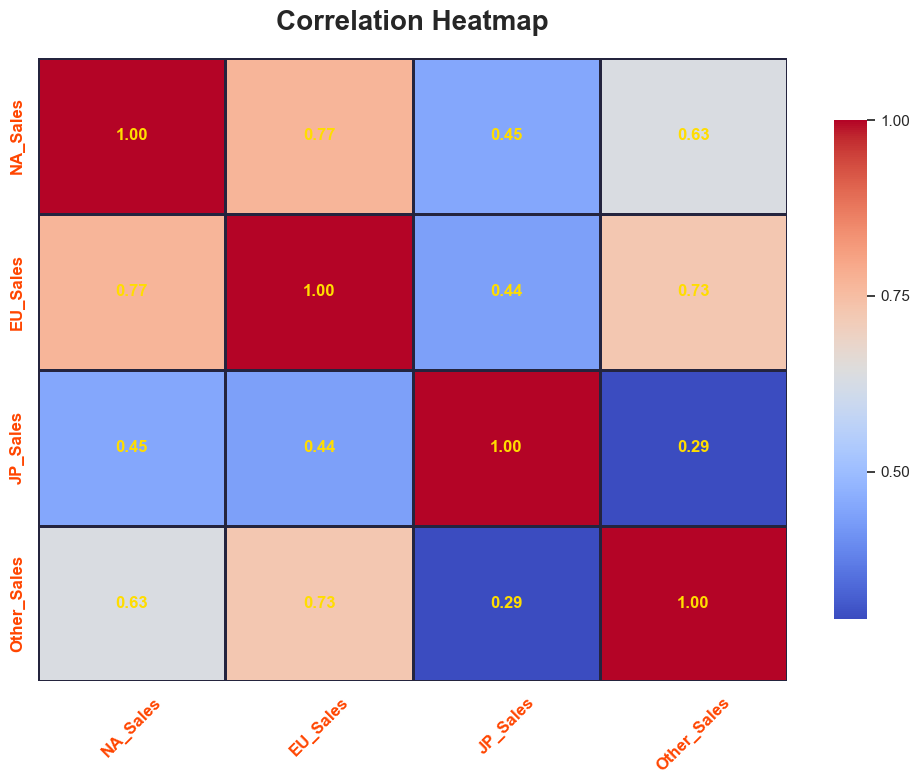

In [162]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the gaming-inspired style with subtle gridlines
sns.set_theme(style="white", rc={"axes.facecolor": "#24243e", "grid.color": "#302b63"})

# Create the heatmap
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(
    df[["NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales"]].corr(),
    annot=True,  # Show correlation values
    fmt=".2f",  # Format values to 2 decimal points
    cmap="coolwarm",  # Cool-Warm color palette for contrast
    linewidths=1,  # Clear separation between cells
    linecolor="#24243e",  # Matches the background
    annot_kws={"size": 12, "color": "#FFDD00", "weight": "bold"},  # Changed annotation text to golden yellow
    cbar_kws={"shrink": 0.8, "aspect": 15, "ticks": [0.0, 0.25, 0.5, 0.75, 1.0]},  # Customized color bar
)

# Add a title with gaming aesthetics and new text color
plt.title(
    "Correlation Heatmap", 
    fontsize=20,
    fontweight="bold", 
    pad=20
)

# Customize x and y ticks with bold fonts and bright colors
plt.xticks(fontsize=12, color="#FF4500", rotation=45, fontweight="bold")  # Changed to neon orange
plt.yticks(fontsize=12, color="#FF4500", fontweight="bold")  # Changed to neon orange

# Align the heatmap with the background theme
plt.gca().set_facecolor("#0f0c29")  # Deep, dark background to blend seamlessly
plt.tight_layout()  # Ensure layout is optimized

# Display the styled heatmap
plt.show()

In [164]:
data_pair = df.loc[:,["Year","Platform", "Genre", "NA_Sales","EU_Sales", "Other_Sales"]]
data_pair

,Year,Platform,Genre,NA_Sales,EU_Sales,Other_Sales
0,2006.0,Wii,Sports,41.49,29.02,8.46
1,1985.0,NES,Platform,29.08,3.58,0.77
2,2008.0,Wii,Racing,15.85,12.88,3.31
3,2009.0,Wii,Sports,15.75,11.01,2.96
4,1996.0,GB,Role-Playing,11.27,8.89,1.00
...,...,...,...,...,...,...
16593,2002.0,GBA,Platform,0.01,0.00,0.00
16594,2003.0,GC,Shooter,0.01,0.00,0.00
16595,2008.0,PS2,Racing,0.00,0.00,0.00
16596,2010.0,DS,Puzzle,0.00,0.01,0.00


In [176]:
# Set the style back to default
plt.style.use('default')

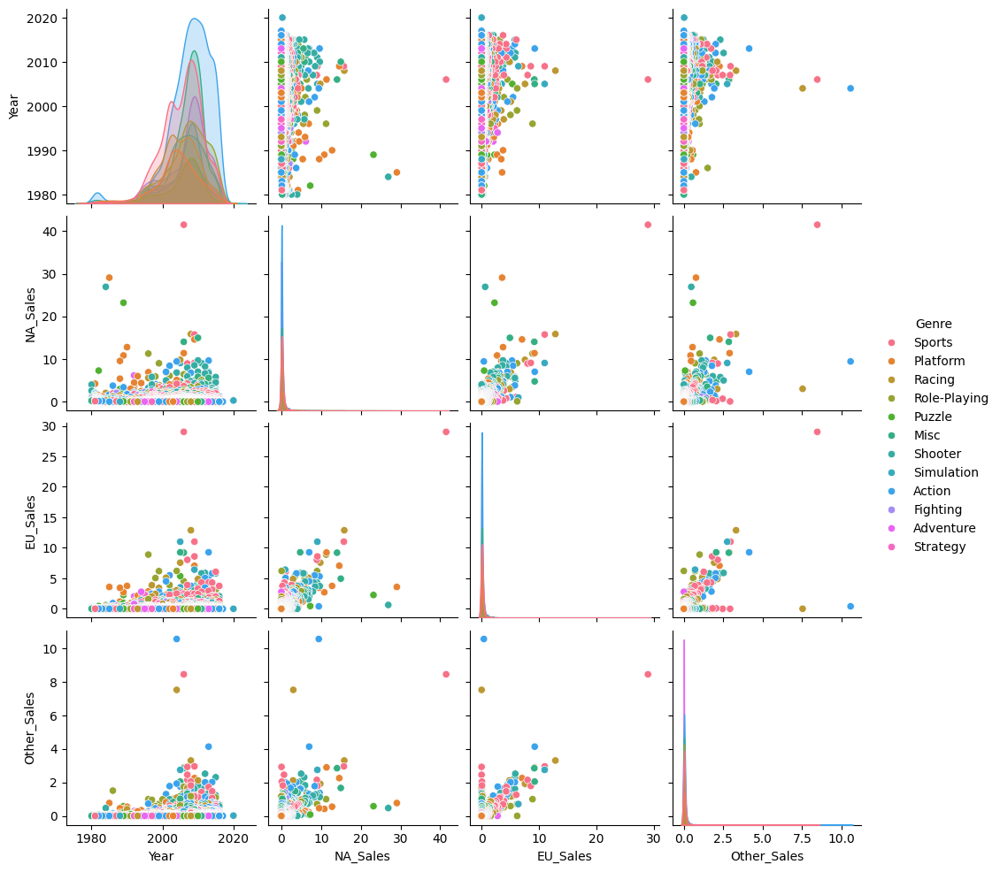

In [178]:
sns.pairplot(data_pair, hue='Genre')
plt.show()

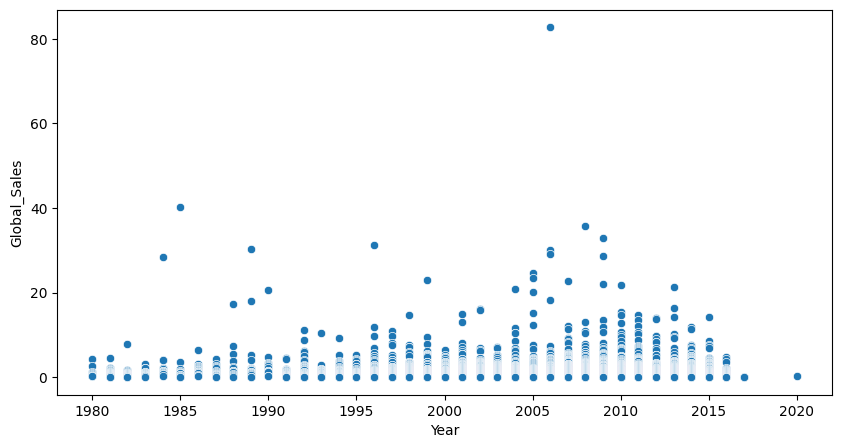

In [179]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=df, x="Year", y="Global_Sales")
plt.show()

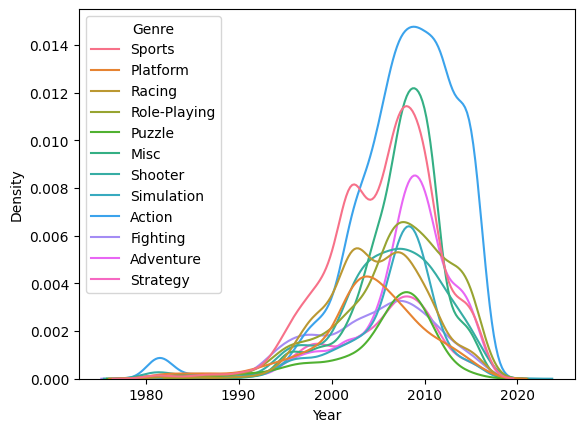

In [180]:
sns.kdeplot(x='Year',data = df,hue ='Genre')
plt.show()

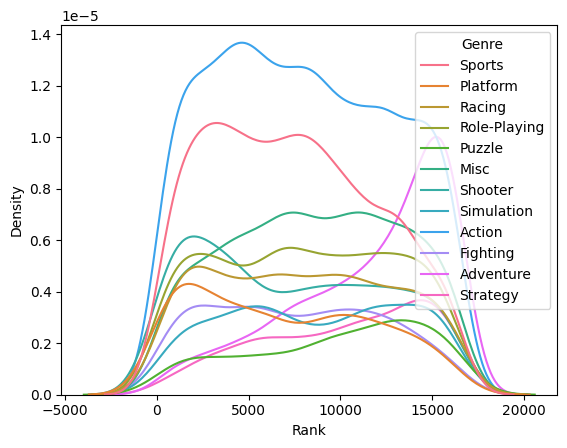

In [181]:
sns.kdeplot(x='Rank',data = df,hue ='Genre')
plt.show()

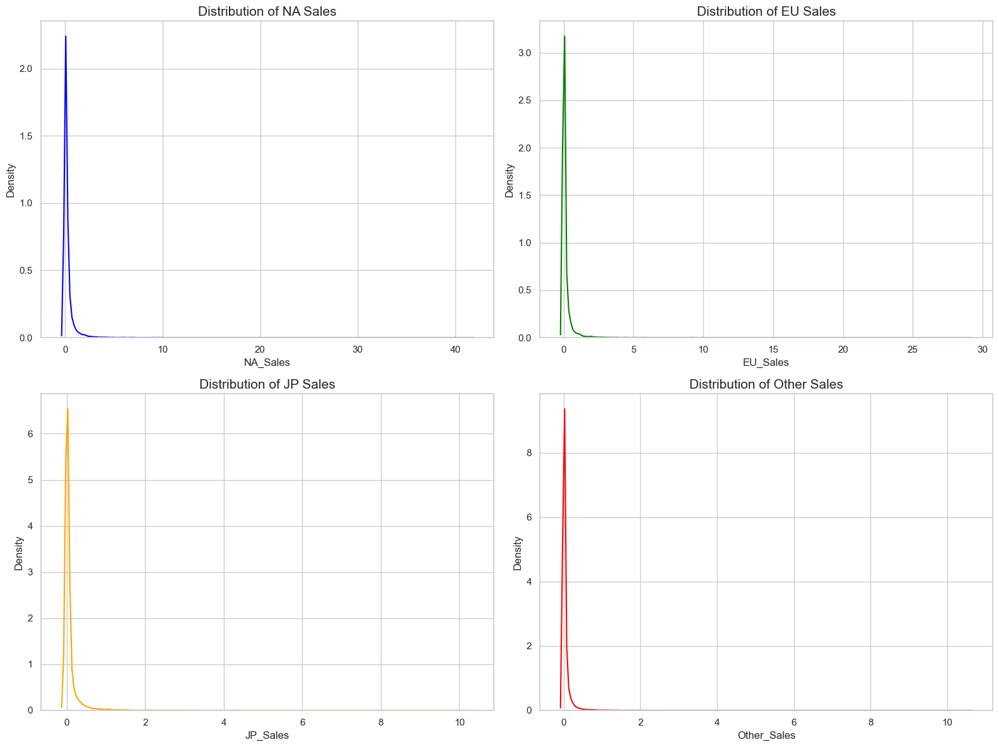

In [170]:
# Set the style of the plot
sns.set(style="whitegrid")

plt.figure(figsize=(16, 12))

# Create a subplot for each distribution
plt.subplot(2, 2, 1)
plt.title("Distribution of NA Sales", fontsize=15)
sns.kdeplot(data=x['NA_Sales'], color='blue')

plt.subplot(2, 2, 2)
plt.title("Distribution of EU Sales", fontsize=15)
sns.kdeplot(data=x['EU_Sales'], color='green')

plt.subplot(2, 2, 3)
plt.title("Distribution of JP Sales", fontsize=15)
sns.kdeplot(data=x['JP_Sales'], color='orange')

plt.subplot(2, 2, 4)
plt.title("Distribution of Other Sales", fontsize=15)
sns.kdeplot(data=x['Other_Sales'], color='red')

plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()

<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        📊 [Level 5: Multivariate Analysis]
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
        Delving into the intricate relationships among multiple variables to uncover hidden patterns and insights! 🔍🔗
    </p>
</div>

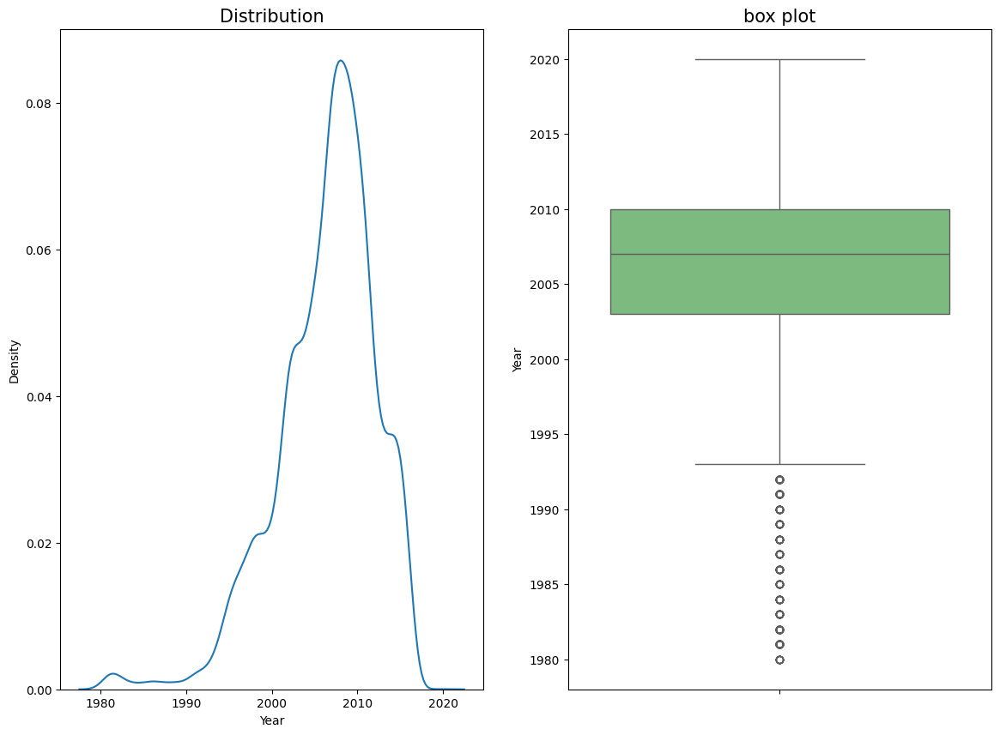

In [187]:
plt.figure(figsize=(14,10))
plt.subplot(1,2,1)
plt.title("Distribution", fontsize=15)
sns.kdeplot(data = df["Year"])
plt.subplot(1,2,2)
plt.title("box plot", fontsize=15)
sns.boxplot(data = df["Year"], palette="Greens")
plt.show()

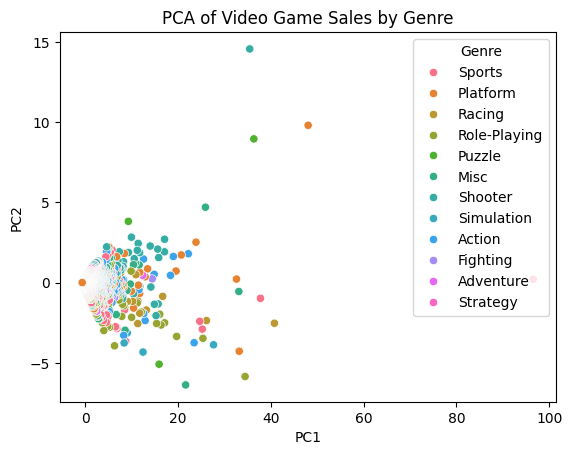

In [189]:
# Select features to use for PCA
features = ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']
X = df[features]

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X)

# Create new dataframe with principal components
df_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Add target variable to new dataframe
df_pca['Genre'] = df['Genre']

# Plot results
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Genre')
plt.title('PCA of Video Game Sales by Genre')
plt.show()


<div style="background: linear-gradient(to right, #0f0c29, #302b63, #24243e); 
            border: 2px solid #FF4500; 
            border-radius: 15px; 
            padding: 15px; 
            text-align: center; 
            font-family: 'Courier New', monospace; 
            color: #FFDD00; 
            box-shadow: 0px 0px 20px #FF4500;">
    <h2 style="color: #FF4500; text-shadow: 3px 3px 0px #000;">
        🎲 [Level 5.1: Distributions]
    </h2>
    <p style="color: #FFFFFF; font-size: 18px; text-align: center; text-shadow: 2px 2px 2px #000;">
        Unveiling the secrets hidden within the data’s distribution—exploring patterns, peaks, and tails! 🔍📈
    </p>
</div>

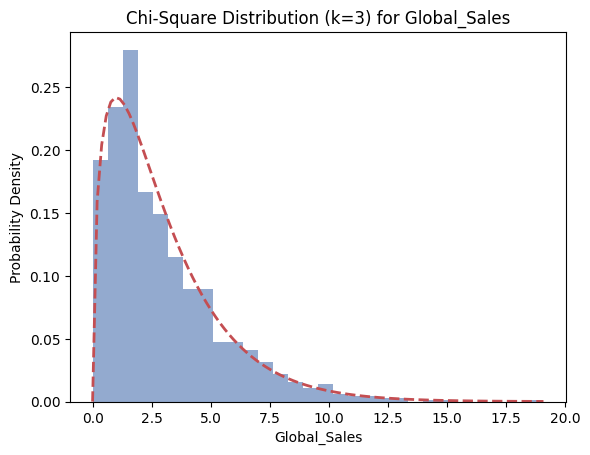

In [192]:
# Extract 'Global_Sales' data from DataFrame
global_sales = df['Global_Sales'].values

# Define the degrees of freedom (k)
k = 3  # Example: Degrees of freedom

# Generate random samples from a chi-square distribution
num_samples = 1000
samples = np.random.chisquare(df=k, size=num_samples)

# Create a histogram to visualize the distribution
plt.hist(samples, bins=30, density=True, alpha=0.6, color='b')

# Create the theoretical probability density function
x = np.linspace(0, max(samples), 100)
pdf = (1/(2**(k/2) * np.math.gamma(k/2))) * x**((k/2) - 1) * np.exp(-x/2)
plt.plot(x, pdf, 'r--', lw=2)

# Add labels and title to the plot
plt.xlabel("Global_Sales")
plt.ylabel("Probability Density")
plt.title(f"Chi-Square Distribution (k={k}) for Global_Sales")

# Show the plot
plt.show()


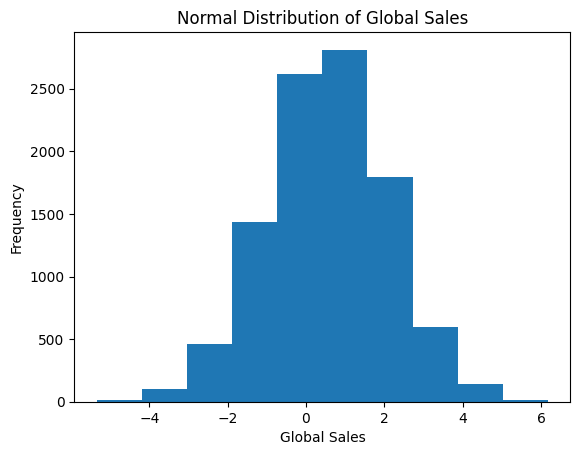

In [194]:
# Extract the global sales column
global_sales = df['Global_Sales']

# Calculate the mean and standard deviation of global sales
mean = global_sales.mean()
std = global_sales.std()

# Create a normal distribution object
norm_dist = np.random.normal(mean, std, size=10000)

# Plot the normal distribution
plt.hist(norm_dist)
plt.xlabel('Global Sales')
plt.ylabel('Frequency')
plt.title('Normal Distribution of Global Sales')
plt.show()

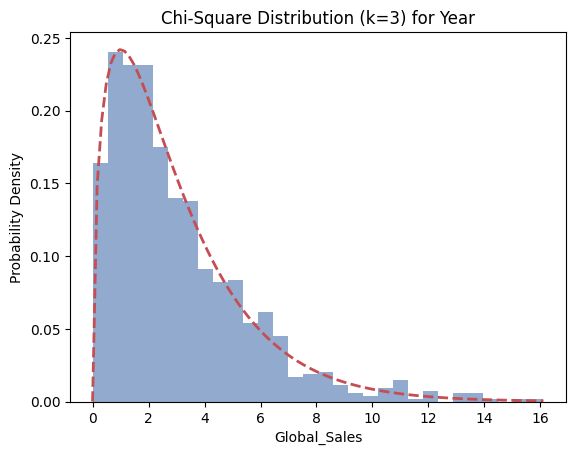

In [196]:
# Extract 'Year' data from DataFrame
global_sales = df['Year'].values

# Define the degrees of freedom (k)
k = 3  # Example: Degrees of freedom

# Generate random samples from a chi-square distribution
num_samples = 1000
samples = np.random.chisquare(df=k, size=num_samples)

# Create a histogram to visualize the distribution
plt.hist(samples, bins=30, density=True, alpha=0.6, color='b')

# Create the theoretical probability density function
x = np.linspace(0, max(samples), 100)
pdf = (1/(2**(k/2) * np.math.gamma(k/2))) * x**((k/2) - 1) * np.exp(-x/2)
plt.plot(x, pdf, 'r--', lw=2)

# Add labels and title to the plot
plt.xlabel("Global_Sales")
plt.ylabel("Probability Density")
plt.title(f"Chi-Square Distribution (k={k}) for Year")

# Show the plot
plt.show()

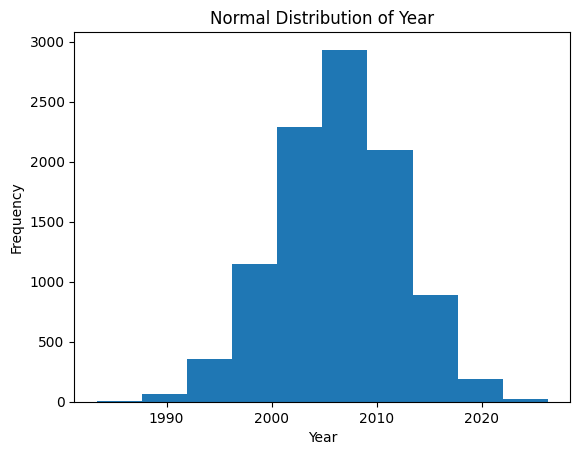

In [198]:
# Extract the 'Year' column
global_sales = df['Year']

# Calculate the mean and standard deviation of Year
mean = global_sales.mean()
std = global_sales.std()

# Create a normal distribution object
norm_dist = np.random.normal(mean, std, size=10000)

# Plot the normal distribution
plt.hist(norm_dist)
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.title('Normal Distribution of Year')
plt.show()

In [200]:
data_hist_log = df.copy()

In [202]:
data_hist_log = data_hist_log[data_hist_log.NA_Sales != 0]
data_hist_log = data_hist_log[data_hist_log.EU_Sales != 0]
data_hist_log = data_hist_log[data_hist_log.Other_Sales != 0]
data_hist_log = data_hist_log[data_hist_log.JP_Sales != 0]
data_hist_log = data_hist_log[data_hist_log.Global_Sales != 0]

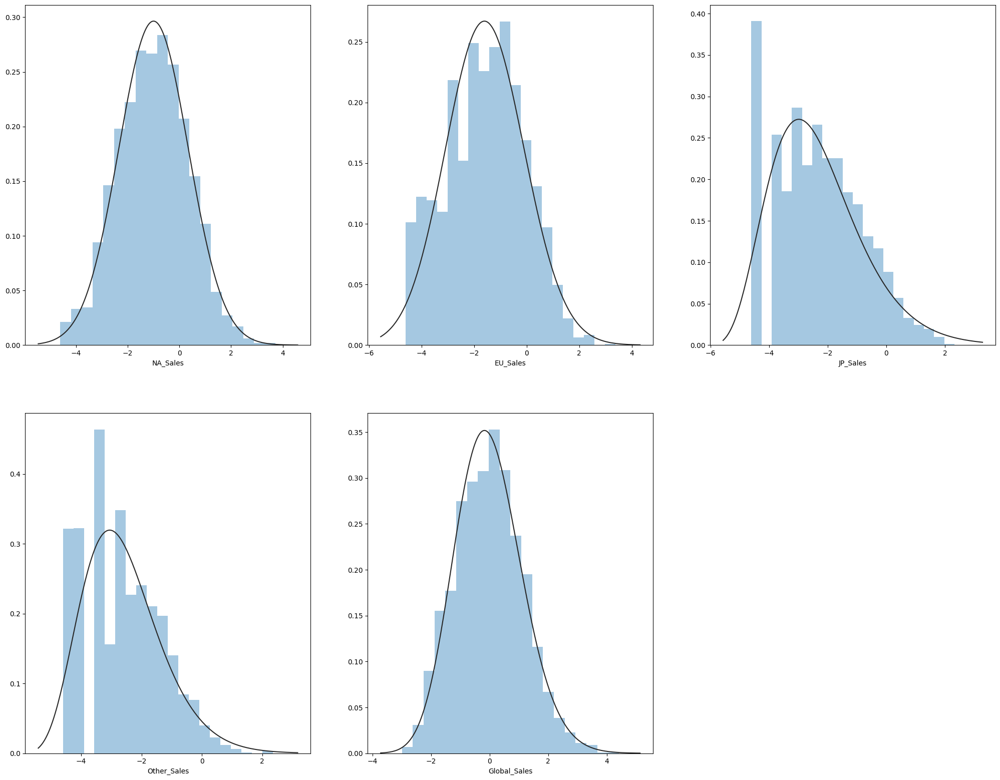

In [204]:
from scipy import stats

plt.figure(figsize=(25,30))
sales_columns = ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']
for i, column in enumerate(sales_columns):
    plt.subplot(3,3,i+1)
    sns.distplot(np.log(data_hist_log[column]), bins=20, kde=False, fit=stats.gamma)
plt.show()

### 🔍 Skewness and Central Tendency 🔍

We can observe their **skewness** and **central tendency**:

- Almost all data show **right-skewed** tendencies.
- Data become **symmetric-skewed** after applying the **log transformation**.

By addressing skewness, we can achieve more balanced data distributions, enhancing the interpretability of our analysis. 📈✨


### 🎯 Hypothesis Testing - Level 6 🎯

- **Understand the Essence**: Hypothesis testing allows us to draw conclusions and make decisions based on data.
- **The Basics**:
  - **Null Hypothesis (H₀)**: No difference or effect is assumed.
  - **Alternative Hypothesis (H₁)**: Difference or effect exists.
  - **Significance Level (α)**: Commonly 0.05, determines threshold for rejecting H₀.

---

#### Steps to Follow:
1. Clearly define **H₀** and **H₁**.
2. Choose the **right statistical test** (e.g., t-test, ANOVA).
3. Set your **significance level** (α = 0.05 or similar).
4. Perform calculations and analyze the **p-value**:
   - **If p ≤ α**: Reject H₀ (evidence supports H₁).
   - **If p > α**: Fail to reject H₀.
5. Interpret and communicate the results in the context of your data.

---

### 📊 Two-Sample T-Test: Comparing Group Means

A **two-sample t-test** is used to compare the means of two groups to determine if there is a statistically significant difference between them.

---

#### Formula:
**t =**  
$$\frac{\bar{x}_1 - \bar{x}_2}{\sqrt{\frac{s_1^2}{n_1} + \frac{s_2^2}{n_2}}}$$

---

#### Where:
- **$\bar{x}_1$** and **$\bar{x}_2$**: The sample means of the two groups  
- **$s_1^2$** and **$s_2^2$**: The sample variances of the two groups  
- **$n_1$** and **$n_2$**: The sample sizes of the two groups  

---

### ✨ Key Insights:
- This formula calculates the t-statistic, which tells us how far apart the two sample means are, relative to the variability within the samples.
- A **higher t-value** suggests a larger difference between group means.
- Compare the t-value to a **critical value** (from the t-distribution table) or use the **p-value** to assess significance.

---


### 📊 F-Test: Comparing Variances of Two Groups

The **F-test** is used to compare the **variances** of two groups to determine if they are significantly different.

---

#### Formula:
**F =**  
$$\frac{s_1^2}{s_2^2}$$

---

#### Where:
- **$s_1^2$**: Variance of the first group  
- **$s_2^2$**: Variance of the second group  

---

### ✨ Key Points:
- The **F-distribution** is used to evaluate the F-statistic.  
- If **F = 1**, the variances of the two groups are equal.  
- A large **F-value** suggests that the variances are significantly different.  
- Compare the calculated F-value to the **critical value** from the F-distribution table or analyze the **p-value** to assess significance.

---

#### 🌟 Example Use Case:
To test whether the variances of **NA Sales** and **EU Sales** are equal:  
- Calculate **$s_1^2$** (variance of NA Sales) and **$s_2^2$** (variance of EU Sales).  
- Use the formula to compute the F-statistic.  
- Compare it to the critical value or p-value to draw a conclusion.  

---


In [218]:
na_sales = df['NA_Sales']
eu_sales = df['EU_Sales']

# Conduct a two-sample t-test to compare the means of the two groups
t_statistic, p_value = ttest_ind(na_sales, eu_sales)

# Print the results of the t-test
print('Two-sample t-test results:')
print('t-statistic:', t_statistic)
print('p-value:', p_value)

# Extract the sales columns for Japan and North America
jp_sales = df['JP_Sales']

# Conduct an F-test to compare the variances of the two groups
f_statistic, p_value = f_oneway(jp_sales, na_sales)

# Print the results of the F-test
print('F-test results:')
print('F-statistic:', f_statistic)
print('p-value:', p_value)


Two-sample t-test results:
t-statistic: 15.831371100049914
p-value: 3.0384925458015177e-56
F-test results:
F-statistic: 760.1394504077623
p-value: 1.8417918080111082e-165


### 📊 Hypothesis Testing Results 📊

#### **Hypothesis 1**:  
The **t-statistic** of **15.83** and **p-value** of **3.04e-56** provide **strong evidence** that:  
> **The mean video game sales in North America are significantly higher than the mean video game sales in Europe.**

---

#### **Hypothesis 2**:  
The **F-statistic** of **760.14** and **p-value** of **1.84e-165** provide **even stronger evidence** that:  
> **The variance of video game sales in Japan is significantly higher than the variance of video game sales in North America.**

---

### ✨ Key Takeaways:
- **Hypothesis 1** suggests a significant difference in average sales between North America and Europe.  
- **Hypothesis 2** highlights a much greater variability in Japan's sales compared to North America.  

These results strengthen our understanding of the regional differences in video game sales. 📈🎮

# SECTION _ II

## Questions for Analysis

### 1.How is sales distribution across the global market?

In [ ]:
## Sum of all Sales
total_na_sales = df['NA_Sales'].sum()
total_eu_sales = df['EU_Sales'].sum()
total_jp_sales = df['JP_Sales'].sum()
total_other_sales = df['Other_Sales'].sum()

# Creating a list of sales values for each region
sales_values = [total_na_sales, total_eu_sales, total_jp_sales, total_other_sales]
regions = ['North America', 'Europe', 'Japan', 'Other Countries']

# Create a pie chart for the sales distribution
plt.figure(figsize=(8,8))
plt.pie(sales_values, labels=regions,explode = [0.1,0,0.1,0.1], autopct="%1.1f%%", startangle=140, colors=['blue', 'green', 'orange', 'red'])

## Title
plt.title("Sales Distribution on Global Market", fontsize=15)

## Display of plot
plt.show()

North America has the highest shares

### 2 .list the platforms that support video games?

In [ ]:
plt.figure(figsize=(20,10))
sns.kdeplot( data=df,  x='Year',hue="Platform", fill=True, common_norm=False, palette="icefire", alpha=.5, linewidth=0,legend=True)
plt.show()

### 🎮 Evolution of Gaming Platforms Over the Years 🎮

#### **Early 1980s**:
- **2600** emerged as the **most popular platform** of the time.

#### **Mid 1980s**:
- **NES** (Nintendo Entertainment System) gained **immense popularity**, becoming a dominant gaming platform.

#### **Start of the 1990s**:
- The **Game Boy (GB)** became the favorite gaming platform, marking its rise.

#### **Mid 1990s**:
- **GB**'s popularity declined, giving way to platforms like **SNES, DC, 3DO, and WS**.  
- **SAT** (Sega Saturn) stood out as the **highest-grossing platform** during this period.

#### **Late 1990s**:
- Platforms such as **PlayStation (PS)**, **Xbox (XB)**, and **NES** resurfaced with renewed popularity.

#### **Early 2000s**:
- **SCD**, **SAT**, and **NES** were among the **highest-grossing platforms** of the decade.

#### **Mid 2000s**:
- Platforms like **PSP, WiiU, PS2**, and **SNES** made a comeback.  
- **GBA** and **GC** also gained significant popularity.

#### **Late 2000s**:
- The **Game Boy (GB)** resurfaced alongside **Wii, PS3, X360**, and **DS**, which became **highly used gaming platforms**.

#### **Early 2010s**:
- **GB** continued its presence along with **Wii, PS3, X360, and DS**.  
- Additionally, **3DS** and **WiiU** became **highly grossing platforms** during this time.

#### **Mid 2010s**:
- **PS4** emerged as a **very popular platform**, while **PSV, WiiU, 3DS**, and **PCs** remained **highly grossing**.

---

### 🌟 Key Highlights:
- **SAT** (Sega Saturn) was the **highest-grossing gaming platform of all time**.  
- **NES** holds the record as the **longest-grossing platform**, thriving for a remarkable **25 years**!

---


### 3. Number of games that support these Platforms?

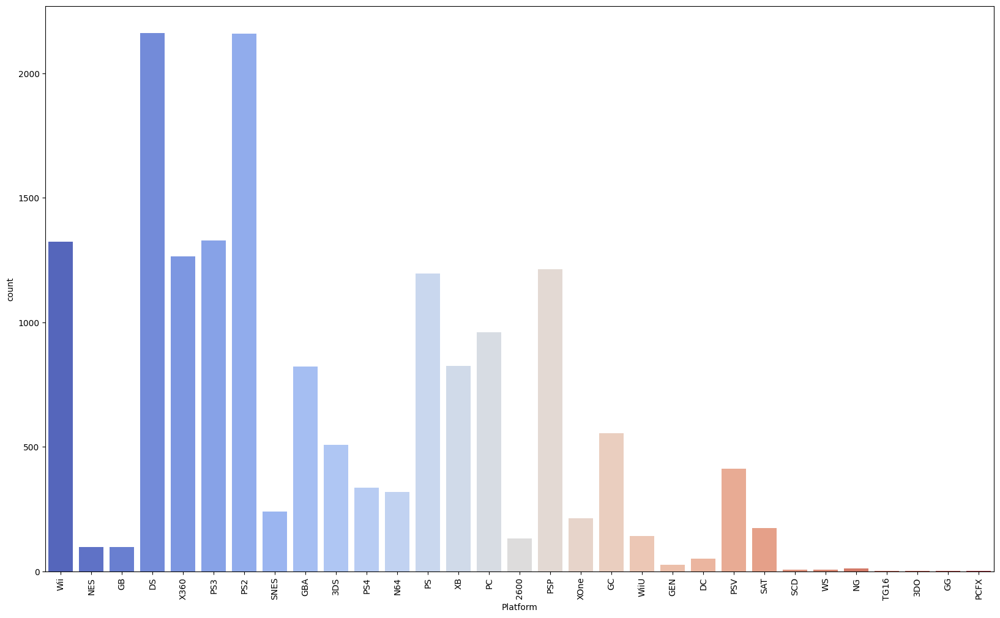

In [223]:
plt.figure(figsize=(20,12))
b=sns.countplot(x= 'Platform' ,data = df ,palette='coolwarm'  )
plt.xticks(rotation=90)
plt.show()

DS, PS2, PS3, Wii, X360, PSP, PS, PC, XB, GBA, GC, 3DS, PSV, PS4, N64, SNES, XOne,
SAT, WiiU, 2600, NES, GB, DC, GEN, NG, SCD, WS, 3DO, TG16, GG, PCFX


### 4. Global Sales of these Platforms?

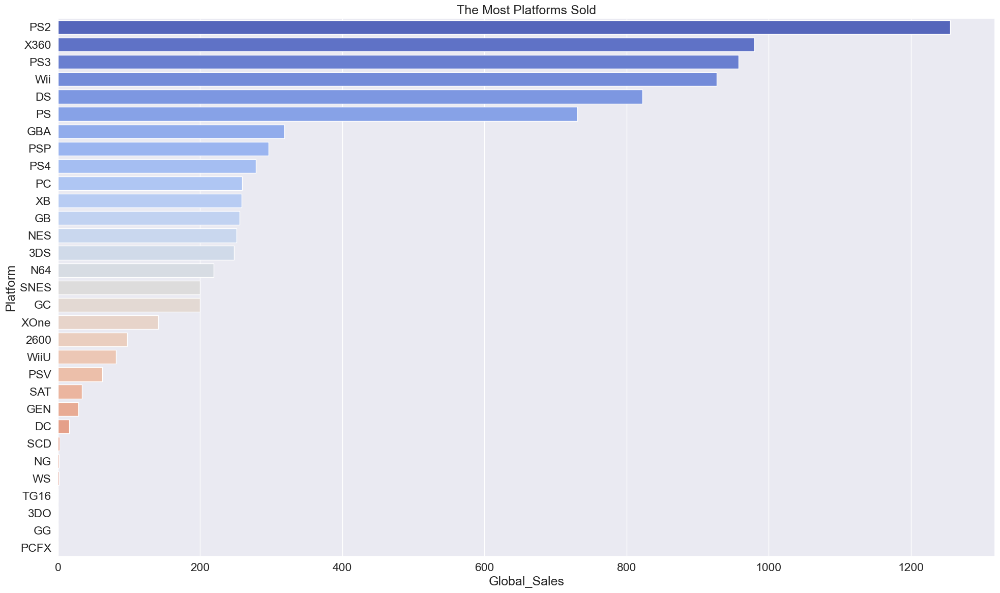

In [227]:
plt.figure(figsize=(20, 12))
sns.set(font_scale = 1.5)
genre=df.groupby(["Platform"])["Global_Sales"].sum().reset_index()
genre=genre.sort_values(by="Global_Sales",ascending=False)
sns.barplot(y="Platform",x="Global_Sales",data=genre,palette='coolwarm' )
plt.title("The Most Platforms Sold")
plt.tight_layout()
plt.show()

PS2 has the highest sales globally

### 5. How many Games were released each year?

In [231]:
# Group the data by year and count the number of games released each year
yearly_releases = df.groupby("Year")["Name"].count()
yearly_releases

Year
1980.0       9
1981.0      46
1982.0      36
1983.0      17
1984.0      14
1985.0      14
1986.0      21
1987.0      16
1988.0      15
1989.0      17
1990.0      16
1991.0      41
1992.0      43
1993.0      60
1994.0     121
1995.0     219
1996.0     263
1997.0     289
1998.0     379
1999.0     338
2000.0     349
2001.0     482
2002.0     829
2003.0     775
2004.0     763
2005.0     941
2006.0    1008
2007.0    1473
2008.0    1428
2009.0    1431
2010.0    1259
2011.0    1139
2012.0     657
2013.0     546
2014.0     582
2015.0     614
2016.0     344
2017.0       3
2020.0       1
Name: Name, dtype: int64

### 6. Trends in Video Game releases each year.

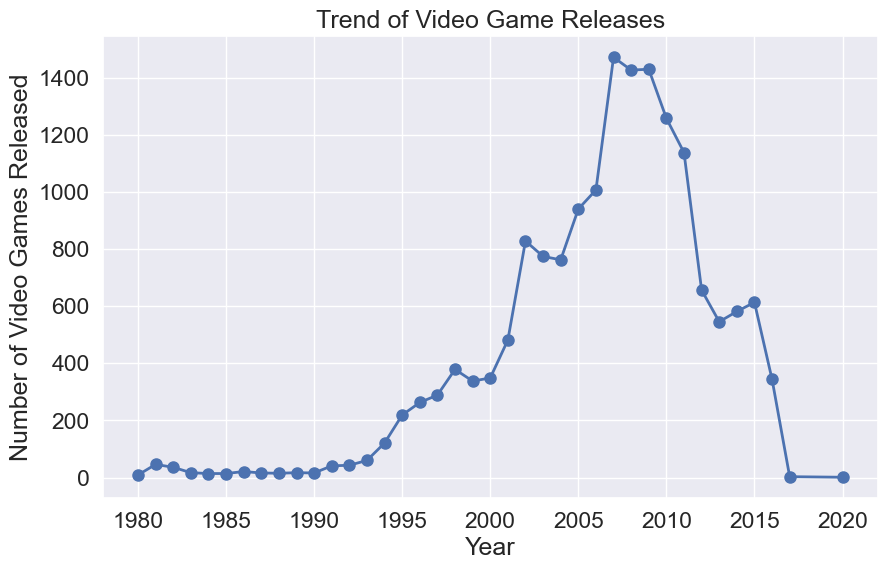

In [234]:
# Create a line chart for the trend of video game releases each year
plt.figure(figsize=(10, 6))
plt.plot(yearly_releases.index, yearly_releases.values, marker='o', color='b', linestyle='-', linewidth=2, markersize=8)
plt.xlabel("Year")
plt.ylabel("Number of Video Games Released")
plt.title("Trend of Video Game Releases")
plt.grid(True)
plt.show()


### 📈 Trends in Video Game Releases (2005-2020)

#### **Increasing Trend (2005-2009):**
- The number of video game releases **steadily increased** from **941 in 2005** to **1473 in 2007**, peaking in 2007.
- This period marked a **significant rise** in the gaming industry.

---

#### **Decreasing Trend (2009-2016):**
- Following 2009, there was a **gradual decline** in the number of game releases.
- Releases dropped from **1473 in 2007** to **344 in 2016**.
- Possible reasons for the decline:
  - **Market saturation**
  - **Shifts in gaming platforms**

---

#### **Stabilization (2016-2020):**
- After 2016, the number of game releases **stabilized** around **300-400 per year**.
- This suggests a **new balance** in the industry, with a consistent annual output.

---

#### **Significant Drops (2017-2020):**
- **2017** saw a sharp decline, with only **3 releases** recorded.
- **2020** had just **1 release**, representing a **major shift** in the gaming industry.
- These drops might be attributed to:
  - **Emerging trends**, such as mobile gaming
  - **Changes in consumer preferences**

---

### 7. What is the distribution of genre in Video Games?

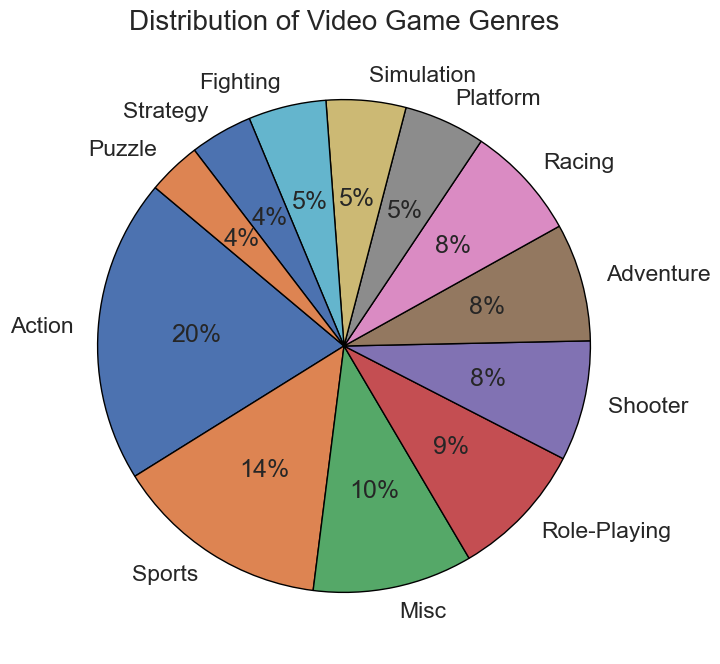

In [238]:
all_genres = df['Genre'].value_counts()

## Plotting the graph
plt.figure(figsize=(8,8))
plt.pie(all_genres, labels=all_genres.index, wedgeprops={"edgecolor":"black"}, autopct='%1.0f%%', startangle=140)

## Title
plt.title('Distribution of Video Game Genres', fontsize=20)

## Display of plot
plt.show()

### 🎮 Video Game Market Overview

#### **Dominant Genres**:
- **Action**, **sports**, and **miscellaneous** games dominate the video game market, reflecting their broad appeal and popularity among players.

---

#### **Moderately Popular Genres**:
- Genres with **moderate popularity** include:
  - **Role-playing**
  - **Shooter**
  - **Adventure**
  - **Racing**
  - **Platform**
  - **Simulation**
  - **Fighting**

---

#### **Least Popular Genres**:
- **Strategy** and **puzzle** games have the **lowest demand**, appealing to more niche audiences.

---

### ✨ Key Insights:
- Each **game genre** caters to different **player types** and **preferences**, shaping their position in the market.
- While some genres dominate the landscape, others thrive within specific communities and niches.

### 8. What is the trend of Global Sales each year?

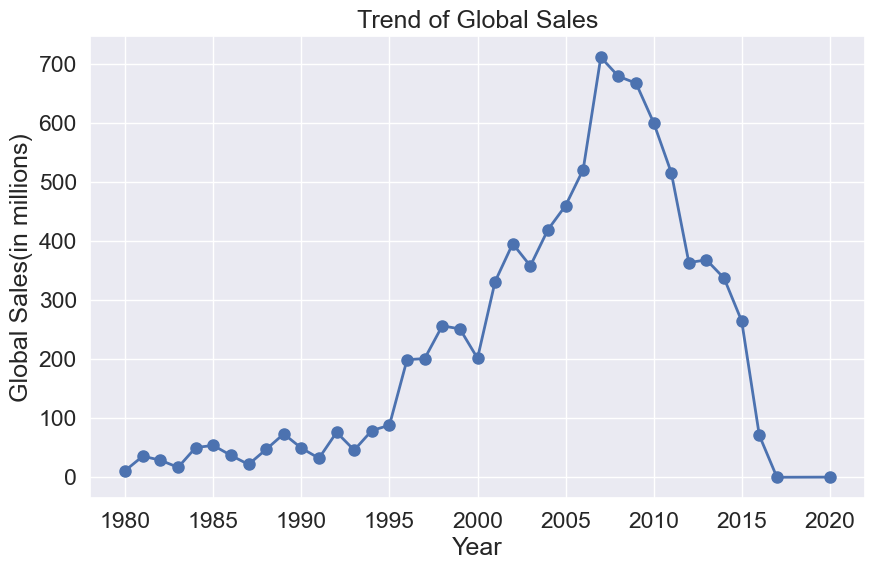

In [243]:
# Group the data by year and sum the global sales for each year
yearly_sales = df.groupby("Year")["Global_Sales"].sum()

# Create a line chart for the trend of global sales each year
plt.figure(figsize=(10, 6))
plt.plot(yearly_sales.index, yearly_sales.values, marker='o', color='b', linestyle='-', linewidth=2, markersize=8)
plt.xlabel("Year")
plt.ylabel("Global Sales(in millions)")
plt.title("Trend of Global Sales")
plt.grid(True)
plt.show()


### 📊 Global Video Game Sales Trends (1980s - 2020)

#### **1980s to Early 1990s**:
- Global sales started relatively **low** in the early 1980s.
- A **gradual increase** was observed, with **spikes in 1989** and **1994** marking significant milestones.

---

#### **Mid-1990s to Early 2000s**:
- Following the spike in **1994**, sales remained **consistently high** through the mid to late 1990s and early 2000s.
- Sales **peaked in 1998**, showcasing the robust growth of the gaming industry during this period.

---

#### **Early 2000s**:
- A **slight decline** occurred in the early 2000s.  
- However, sales experienced a **significant rebound** in **2001 and 2002**.

---

#### **Mid-2000s to 2010s**:
- Sales remained **high** during the mid-2000s, reaching their **peak in 2008**.  
- After 2008, there was a **notable decline**, but sales **stabilized at relatively high levels** until 2010.

---

#### **2010s to 2020**:
- From **2010 onwards**, there was a **general downward trend**, with sales decreasing each year.
- A **steep decline** was observed in **2013**, followed by a **slight increase in 2014**.  
- The overall trend, however, remained **negative** throughout the decade.

---

#### **2016 to 2020**:
- Sales **continued to decline significantly**, reaching **negligible levels in 2017**.  
- By **2020**, the number of sales had remained **extremely low**, highlighting a shift in the gaming landscape.

---

### 🌟 Key Observations:
- **Peak Years**: 1994, 1998, and 2008 marked the highest sales points in gaming history.
- **Decline Phase**: The trend post-2008 shows a significant **industry shift**, possibly influenced by market saturation or changing consumer preferences.


### 9. What is the top-sold Genre in the North American market?


In [247]:
# Group data by genre and calculate total sales for North America
genre_sales_na = df.groupby("Genre")["NA_Sales"].sum()

# Find the genre with the highest sales in North America
top_genre_na = genre_sales_na.idxmax()
top_sales_na = genre_sales_na.max()

print(f"The top-selling genre in North America is '{top_genre_na}' with total sales of {top_sales_na} million copies.")

The top-selling genre in North America is 'Action' with total sales of 877.83 million copies.


In [249]:
genre_sales_na

Genre
Action          877.83
Adventure       105.80
Fighting        223.59
Misc            410.24
Platform        447.05
Puzzle          123.78
Racing          359.42
Role-Playing    327.28
Shooter         582.60
Simulation      183.31
Sports          683.35
Strategy         68.70
Name: NA_Sales, dtype: float64

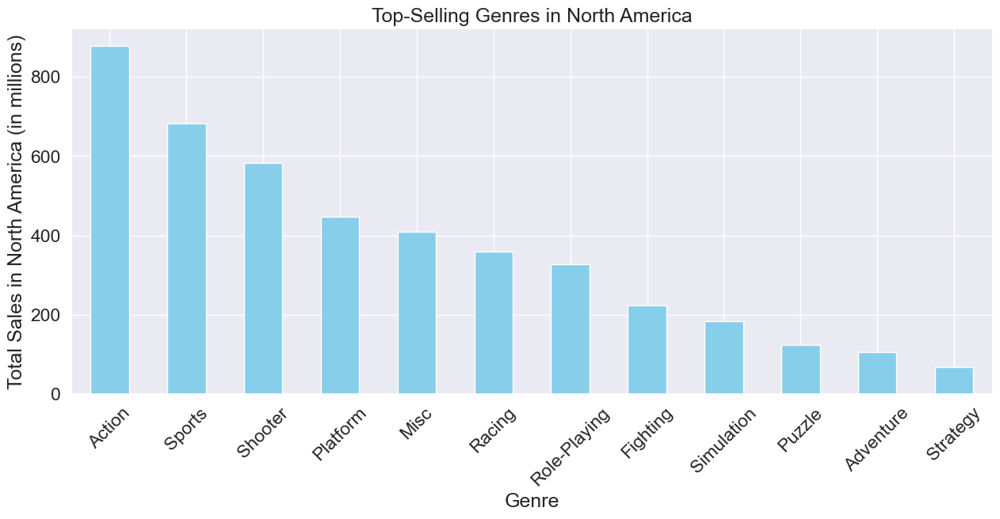

In [251]:
genre_sales_na = genre_sales_na.sort_values(ascending=False)

# Bar plot for top-selling genres in North America
plt.figure(figsize=(15, 6))
genre_sales_na.plot(kind='bar', color='skyblue')
plt.xlabel("Genre")
plt.ylabel("Total Sales in North America (in millions)")
plt.title("Top-Selling Genres in North America")
plt.xticks(rotation=45)
plt.show()

### 10. What is the top-sold Genre in the European market?

In [254]:
# Group data by genre and calculate total sales for Europe
genre_sales_eu = df.groupby("Genre")["EU_Sales"].sum()

# Find the genre with the highest sales in Europe
top_genre_eu = genre_sales_eu.idxmax()
top_sales_eu = genre_sales_eu.max()

print(f"The top-selling genre in Europe is '{top_genre_eu}' with total sales of {top_sales_eu} million copies.")

The top-selling genre in Europe is 'Action' with total sales of 525.0 million copies.


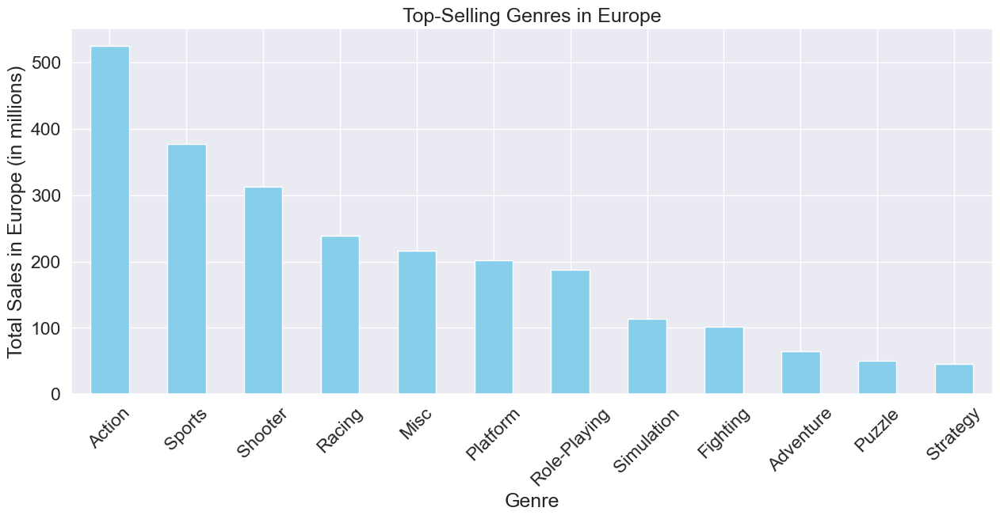

In [256]:
genre_sales_eu = genre_sales_eu.sort_values(ascending=False)

# Bar plot for top-selling genres in Europe
plt.figure(figsize=(15, 6))
genre_sales_eu.plot(kind='bar', color='skyblue')
plt.xlabel("Genre")
plt.ylabel("Total Sales in Europe (in millions)")
plt.title("Top-Selling Genres in Europe")
plt.xticks(rotation=45)
plt.show()

### 11. What is the top-sold Genre in the Japanese market?

In [259]:
# Group data by genre and calculate total sales for Other 
genre_sales_jp = df.groupby("Genre")["JP_Sales"].sum()

# Find the genre with the highest sales in Japan
top_genre_jp = genre_sales_jp.idxmax()
top_sales_jp = genre_sales_jp.max()

print(f"The top-selling genre in Japan is '{top_genre_jp}' with total sales of {top_sales_jp} million copies.")

The top-selling genre in Japan is 'Role-Playing' with total sales of 352.31 million copies.


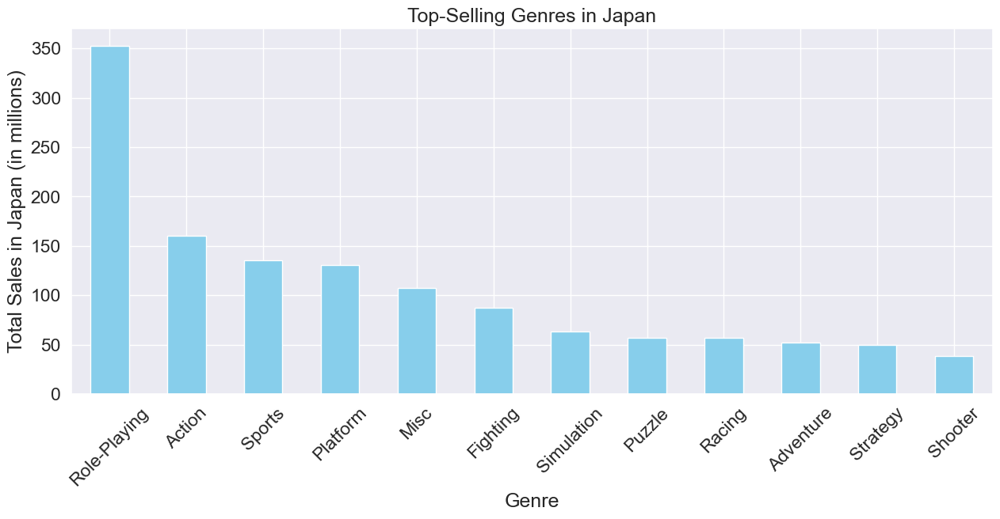

In [261]:
genre_sales_jp = genre_sales_jp.sort_values(ascending=False)

# Bar plot for top-selling genres in Japan
plt.figure(figsize=(15, 6))
genre_sales_jp.plot(kind='bar', color='skyblue')
plt.xlabel("Genre")
plt.ylabel("Total Sales in Japan (in millions)")
plt.title("Top-Selling Genres in Japan")
plt.xticks(rotation=45)
plt.show()

### 12. What is the top-sold Genre in Other Country Markets?

In [264]:
# Group data by genre and calculate total sales for Other 
genre_sales_Other = df.groupby("Genre")["Other_Sales"].sum()

# Find the genre with the highest sales in Other Countries
top_genre_Other = genre_sales_Other.idxmax()
top_sales_Other = genre_sales_Other.max()

print(f"The top-selling genre in Other Countries is '{top_genre_Other}' with total sales of {top_sales_Other} million copies.")

The top-selling genre in Other Countries is 'Action' with total sales of 187.38 million copies.


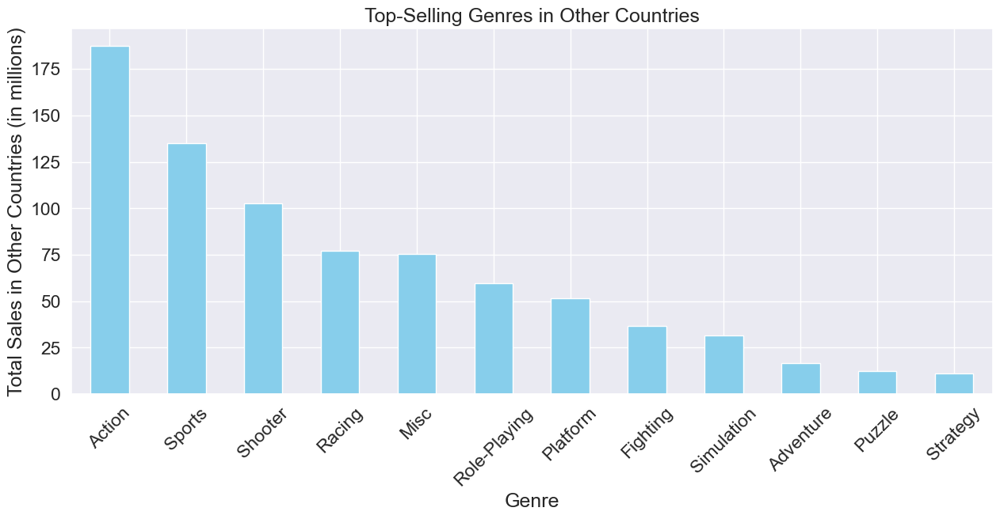

In [266]:
genre_sales_Other = genre_sales_Other.sort_values(ascending=False)

# Bar plot for top-selling genres in Other Countries
plt.figure(figsize=(15, 6))
genre_sales_Other.plot(kind='bar', color='skyblue')
plt.xlabel("Genre")
plt.ylabel("Total Sales in Other Countries (in millions)")
plt.title("Top-Selling Genres in Other Countries")
plt.xticks(rotation=45)
plt.show()

### 13. What is the top-sold Genre in the Global Market?

In [269]:
# Group data by genre and calculate total Global sales  
genre_sales_global = df.groupby("Genre")["Global_Sales"].sum()

# Find the genre with the highest sales Globally
top_genre_global = genre_sales_global.idxmax()
top_sales_global = genre_sales_global.max()

print(f"The top-selling genre Globally is '{top_genre_global}' with total sales of {top_sales_global} million copies.")

The top-selling genre Globally is 'Action' with total sales of 1751.18 million copies.


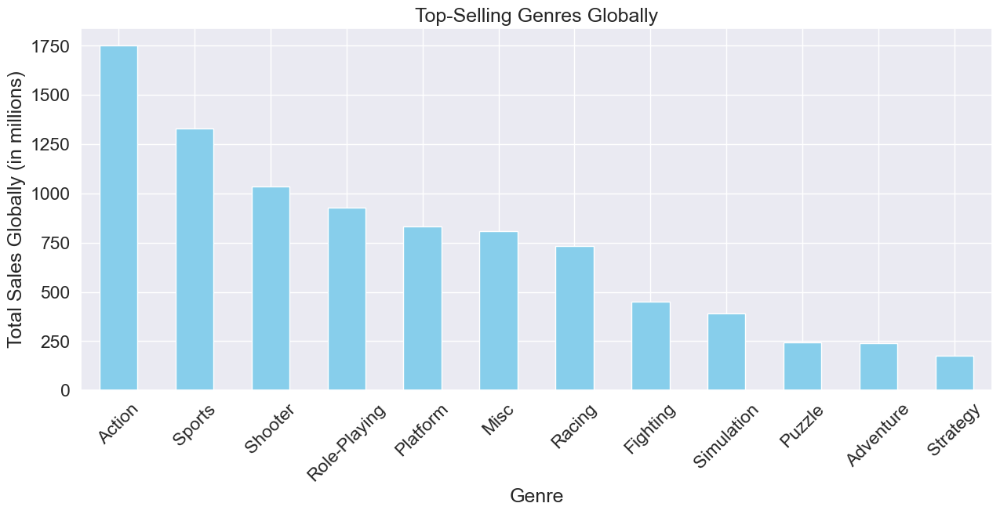

In [271]:
genre_sales_global = genre_sales_global.sort_values(ascending=False)

# Bar plot for top-selling genres Globally
plt.figure(figsize=(15, 6))
genre_sales_global.plot(kind='bar', color='skyblue')
plt.xlabel("Genre")
plt.ylabel("Total Sales Globally (in millions)")
plt.title("Top-Selling Genres Globally")
plt.xticks(rotation=45)
plt.show()

### 14. Top Publishers Who Have Released More Video Games?

In [274]:
df['Publisher'].value_counts()

Publisher
Electronic Arts                 1409
Activision                       975
Namco Bandai Games               932
Ubisoft                          921
Konami Digital Entertainment     832
                                ... 
Warp                               1
New                                1
Elite                              1
Evolution Games                    1
UIG Entertainment                  1
Name: count, Length: 578, dtype: int64

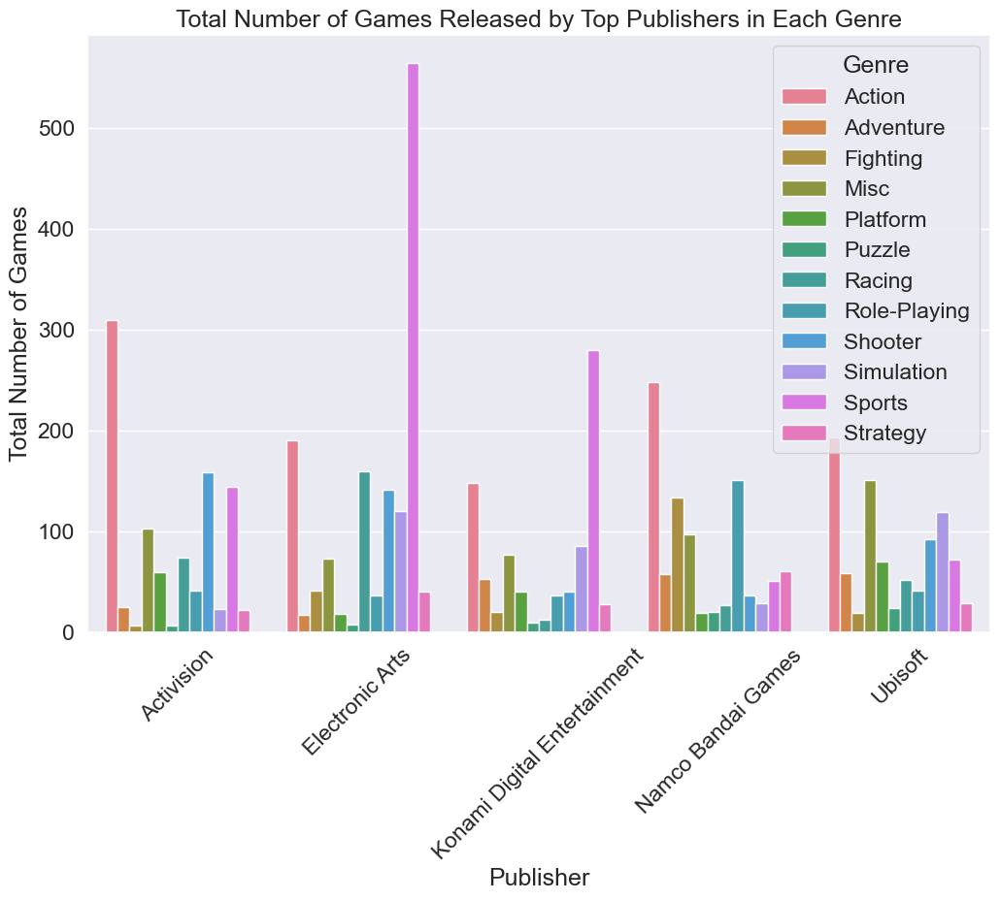

In [276]:
top_publishers = df.groupby('Publisher').size().nlargest(5).index
top_publisher_genre_counts = df[df['Publisher'].isin(top_publishers)].groupby(['Publisher', 'Genre']).size().reset_index(name='Count')
plt.figure(figsize=(12, 8))
sns.barplot(data=top_publisher_genre_counts, x='Publisher', y='Count', hue='Genre')
plt.xticks(rotation=45)
plt.xlabel('Publisher')
plt.ylabel('Total Number of Games')
plt.title('Total Number of Games Released by Top Publishers in Each Genre')
plt.show()

In [277]:
# Top 10 publishers by global sales
top_publishers = df.Publisher.value_counts().head(10)
top_publishers

Publisher
Electronic Arts                 1409
Activision                       975
Namco Bandai Games               932
Ubisoft                          921
Konami Digital Entertainment     832
THQ                              715
Nintendo                         703
Sony Computer Entertainment      683
Sega                             639
Take-Two Interactive             413
Name: count, dtype: int64

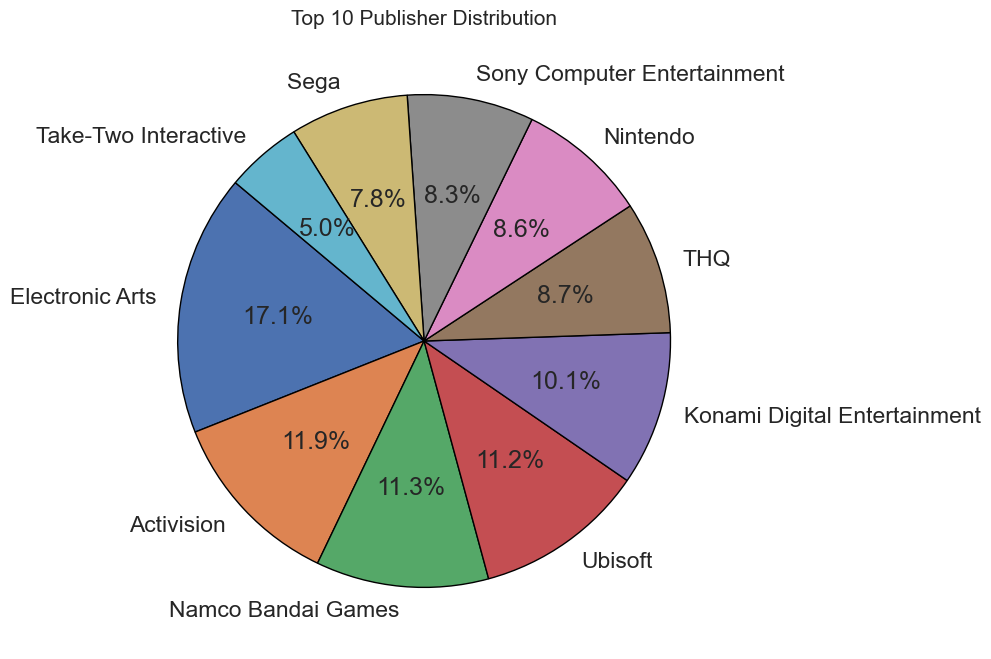

In [278]:
## Plotting graph
plt.figure(figsize=(8,8))

plt.pie(top_publishers, labels=top_publishers.index,wedgeprops={"edgecolor": "black"}, autopct='%1.1f%%', startangle=140)

## Title
plt.title('Top 10 Publisher Distribution', fontsize = 15)

## Display of hte plot
plt.show()

### 15. Top Publishers Who Have Made Most Sales on Video Games?

In [283]:
sales_publisher = df.groupby("Publisher").agg({"Global_Sales": pd.Series.sum})
sales_publisher.nlargest(10, "Global_Sales")

,Global_Sales
Publisher,
Nintendo,1786.56
Electronic Arts,1125.20
Activision,727.46
Sony Computer Entertainment,607.50
Ubisoft,474.72
Take-Two Interactive,399.54
THQ,340.77
Konami Digital Entertainment,283.64
Sega,272.99


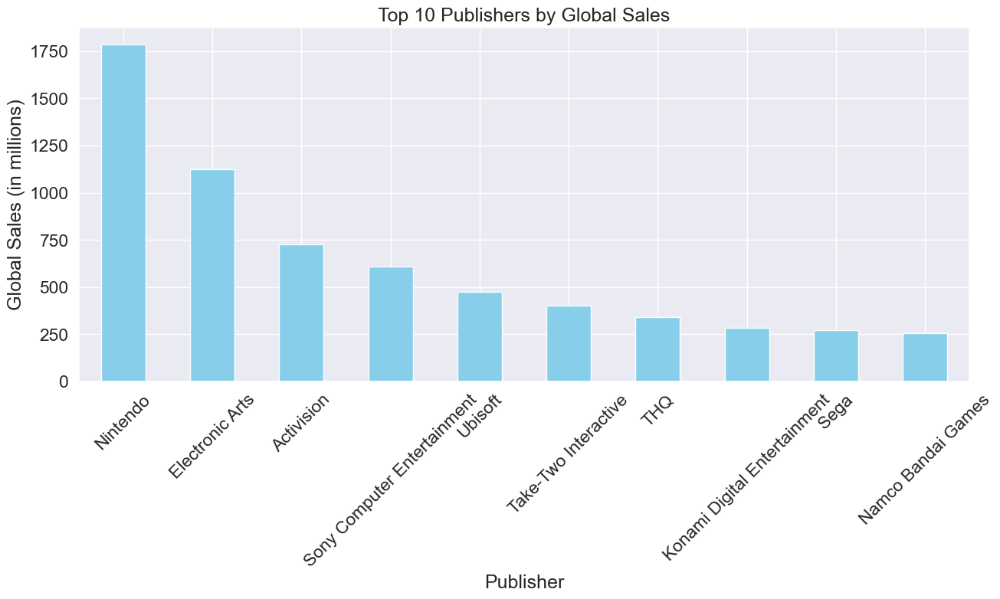

In [285]:
# Group the data by publisher and sum the global sales for each publisher
publisher_sales = df.groupby("Publisher")["Global_Sales"].sum().nlargest(10)

# Create a bar plot for the top 10 publishers by global sales
plt.figure(figsize=(15, 6))
publisher_sales.plot(kind='bar', color='skyblue')
plt.xlabel("Publisher")
plt.ylabel("Global Sales (in millions)")
plt.title("Top 10 Publishers by Global Sales")
plt.xticks(rotation=45)
plt.show()


In [287]:
comp_publisher = df[['Publisher', 'NA_Sales', 'EU_Sales', 'JP_Sales','Other_Sales', 'Global_Sales']]
comp_publisher.head()

,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,Nintendo,41.49,29.02,3.77,8.46,82.74
1,Nintendo,29.08,3.58,6.81,0.77,40.24
2,Nintendo,15.85,12.88,3.79,3.31,35.82
3,Nintendo,15.75,11.01,3.28,2.96,33.00
4,Nintendo,11.27,8.89,10.22,1.00,31.37


In [289]:
comp_publisher = comp_publisher.groupby(by=['Publisher']).sum().reset_index().sort_values(by=['Global_Sales'], ascending=False)
comp_publisher = comp_publisher.head(20)
comp_publisher = pd.melt(comp_publisher, id_vars=['Publisher'],value_vars=['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'],var_name='Sale_Area', value_name='Sale_Price')
comp_publisher

,Publisher,Sale_Area,Sale_Price
0,Nintendo,NA_Sales,816.87
1,Electronic Arts,NA_Sales,603.61
2,Activision,NA_Sales,429.70
3,Sony Computer Entertainment,NA_Sales,265.22
4,Ubisoft,NA_Sales,253.43
...,...,...,...
75,Disney Interactive Studios,Other_Sales,13.18
76,Eidos Interactive,Other_Sales,8.02
77,LucasArts,Other_Sales,10.50
78,Bethesda Softworks,Other_Sales,10.16


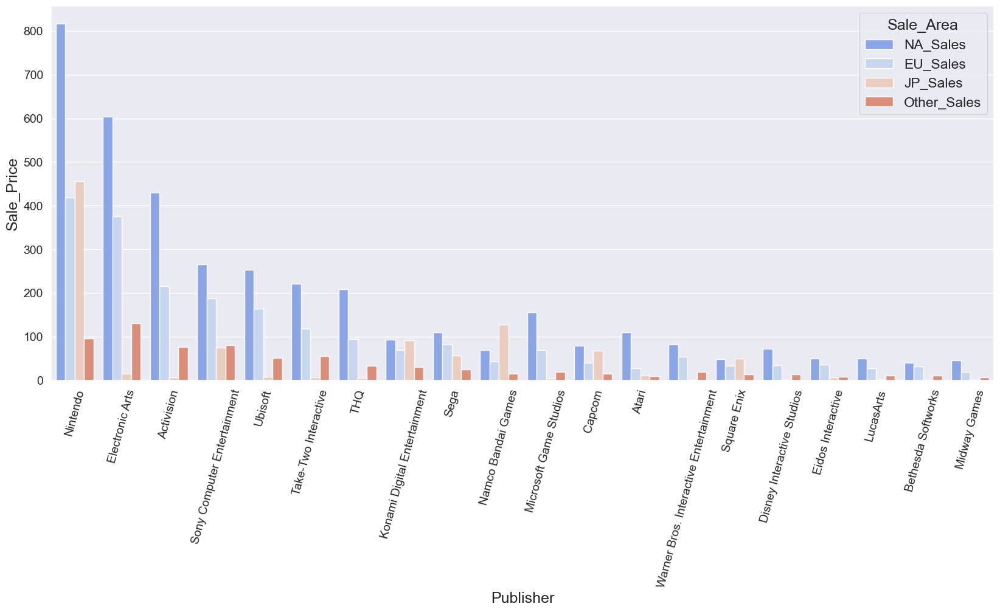

In [291]:
plt.figure(figsize=(20,8))
sns.barplot(x='Publisher', y='Sale_Price', hue='Sale_Area',data=comp_publisher,palette='coolwarm' )
plt.xticks(fontsize=14, rotation=75)
plt.yticks(fontsize=14)
plt.show()

### 16. What are the top-selling game genres across different market areas?


In [294]:
# Group data by genre and calculate total sales for each region
genre_sales_by_region = df.groupby("Genre")[["NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales","Global_Sales"]].sum()
genre_sales_by_region

,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Genre,,,,,
Action,877.83,525.00,159.95,187.38,1751.18
Adventure,105.80,64.13,52.07,16.81,239.04
Fighting,223.59,101.32,87.35,36.68,448.91
Misc,410.24,215.98,107.76,75.32,809.96
Platform,447.05,201.63,130.77,51.59,831.37
Puzzle,123.78,50.78,57.31,12.55,244.95
Racing,359.42,238.39,56.69,77.27,732.04
Role-Playing,327.28,188.06,352.31,59.61,927.37
Shooter,582.60,313.27,38.28,102.69,1037.37


In [296]:
genre_sales = df.groupby('Genre')[['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']].sum()
top_na_genre = genre_sales['NA_Sales'].idxmax()
top_eu_genre = genre_sales['EU_Sales'].idxmax()
top_jp_genre = genre_sales['JP_Sales'].idxmax()
top_other_genre = genre_sales['Other_Sales'].idxmax()
print(f'Top-selling genre in North America: {top_na_genre}')
print(f'Top-selling genre in Europe: {top_eu_genre}')
print(f'Top-selling genre in Japan: {top_jp_genre}')
print(f'Top-selling genre in Other countries: {top_other_genre}')


Top-selling genre in North America: Action
Top-selling genre in Europe: Action
Top-selling genre in Japan: Role-Playing
Top-selling genre in Other countries: Action


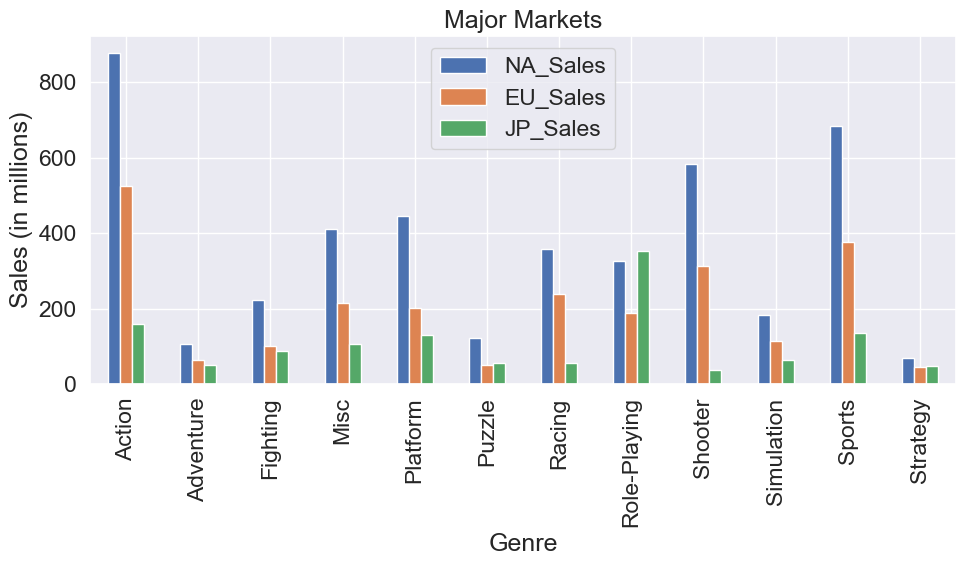

In [298]:
genre_sales = df.groupby('Genre')[['NA_Sales', 'EU_Sales', 'JP_Sales']].sum()

# Create a bar graph
genre_sales.plot(kind='bar',figsize=(10, 6))

## Title
plt.title('Major Markets')

## Labels
plt.xlabel('Genre')
plt.ylabel('Sales (in millions)')

## Rotation
plt.xticks(rotation=90)

plt.legend()

plt.tight_layout()
# Show the plot
plt.show()


### 17. Regional Analysis

In [301]:
highest_na_sales = df.loc[df.groupby('Genre')['NA_Sales'].idxmax()][['Name', 'Genre','Publisher','Year','NA_Sales']]
highest_na_sales = highest_na_sales.sort_values(by='NA_Sales', ascending=False)
highest_na_sales

,Name,Genre,Publisher,Year,NA_Sales
0,Wii Sports,Sports,Nintendo,2006.0,41.49
1,Super Mario Bros.,Platform,Nintendo,1985.0,29.08
9,Duck Hunt,Shooter,Nintendo,1984.0,26.93
5,Tetris,Puzzle,Nintendo,1989.0,23.20
2,Mario Kart Wii,Racing,Nintendo,2008.0,15.85
15,Kinect Adventures!,Misc,Microsoft Game Studios,2010.0,14.97
4,Pokemon Red/Pokemon Blue,Role-Playing,Nintendo,1996.0,11.27
23,Grand Theft Auto V,Action,Take-Two Interactive,2013.0,9.63
10,Nintendogs,Simulation,Nintendo,2005.0,9.07
39,Super Smash Bros. Brawl,Fighting,Nintendo,2008.0,6.75


### 🎮 Key Insights into Video Game Sales 🎮

---

#### 1️⃣ **Nintendo's Domination**:
- **Nintendo** stands out as the publisher of **10 out of the top 12 highest-sold games**, showcasing its **unparalleled influence** in the gaming industry.

---

#### 2️⃣ **Sports Genre in North America**:
- **Sports** is the **most popular genre** in North America.
- **Wii Sports** leads the pack, achieving the **highest sales** of all games in the region.

---

#### 3️⃣ **Shooter and Action Genres**:
- These are the **only genres** with **non-Nintendo top sellers**, namely:
  - **Duck Hunt** (Shooter)
  - **Grand Theft Auto V** (Action)

---

### 🌟 Conclusion:
Nintendo’s dominance is clear, yet genres like **Shooter** and **Action** open the door for other publishers to shine. Sports remain a crowd favorite, particularly in North America. 📊🎮✨


In [304]:
highest_eu_sales = df.loc[df.groupby('Genre')['EU_Sales'].idxmax()][['Name', 'Genre','Publisher','Year','EU_Sales']]
highest_eu_sales = highest_eu_sales.sort_values(by='EU_Sales', ascending=False)
highest_eu_sales

,Name,Genre,Publisher,Year,EU_Sales
0,Wii Sports,Sports,Nintendo,2006.0,29.02
2,Mario Kart Wii,Racing,Nintendo,2008.0,12.88
10,Nintendogs,Simulation,Nintendo,2005.0,11.00
16,Grand Theft Auto V,Action,Take-Two Interactive,2013.0,9.27
19,Brain Age: Train Your Brain in Minutes a Day,Misc,Nintendo,2005.0,9.26
6,New Super Mario Bros.,Platform,Nintendo,2006.0,9.23
4,Pokemon Red/Pokemon Blue,Role-Playing,Nintendo,1996.0,8.89
34,Call of Duty: Black Ops II,Shooter,Activision,2012.0,5.88
27,Brain Age 2: More Training in Minutes a Day,Puzzle,Nintendo,2005.0,5.36
521,Myst,Adventure,Red Orb,1994.0,2.79


### 🎮 Key Insights: Video Game Sales in Europe 🎮

---

#### 1️⃣ **Nintendo's Dominance in Europe**:
- **Nintendo** continues its stronghold as the **leading publisher**, with **8 out of 12 top-selling games** in Europe.

---

#### 2️⃣ **Most Popular Genres**:
- **Sports** and **Racing** dominate the gaming landscape in Europe.
  - **Wii Sports** holds the record for the **highest sales** in Sports.
  - **Mario Kart Wii** leads as the **top-selling Racing game**.

---

#### 3️⃣ **Unique Genres in Europe**:
- Two genres feature different top sellers compared to North America:
  - **Simulation**: **Nintendogs** takes the lead.
  - **Puzzle**: **Brain Age 2** is the highest seller.

---

### 🌟 Conclusion:
Europe's gaming market mirrors some global trends, yet unique genres like **Simulation** and **Puzzle** highlight regional preferences. Nintendo's reign across continents cements its legacy as a powerhouse in the gaming industry. 🚀✨🎮


In [307]:
highest_jp_sales = df.loc[df.groupby('Genre')['JP_Sales'].idxmax()][['Name', 'Genre','Publisher','Year','JP_Sales']]
highest_jp_sales = highest_jp_sales.sort_values(by='JP_Sales', ascending=False)
highest_jp_sales

,Name,Genre,Publisher,Year,JP_Sales
4,Pokemon Red/Pokemon Blue,Role-Playing,Nintendo,1996.0,10.22
1,Super Mario Bros.,Platform,Nintendo,1985.0,6.81
41,Animal Crossing: Wild World,Simulation,Nintendo,2005.0,5.33
27,Brain Age 2: More Training in Minutes a Day,Puzzle,Nintendo,2005.0,5.32
19,Brain Age: Train Your Brain in Minutes a Day,Misc,Nintendo,2005.0,4.16
11,Mario Kart DS,Racing,Nintendo,2005.0,4.13
45,Pokemon HeartGold/Pokemon SoulSilver,Action,Nintendo,2009.0,3.96
0,Wii Sports,Sports,Nintendo,2006.0,3.77
136,Street Fighter II: The World Warrior,Fighting,Capcom,1992.0,2.87
50,Super Mario Land 2: 6 Golden Coins,Adventure,Nintendo,1992.0,2.69


### 🎮 Key Insights: Video Game Sales in Japan 🎮

---

#### 1️⃣ **Most Popular Genre**:
- **Role-Playing** reigns as the **most popular genre** in Japan.
  - **Pokemon Red/Pokemon Blue** leads the sales charts as the **highest-selling game of all time** in this region.

---

#### 2️⃣ **Nintendo's Dominance**:
- **Nintendo** continues its legacy as the **leading publisher**, accounting for **10 out of the 12 top-selling games** in Japan.

---

#### 3️⃣ **Regional Preferences**:
- **Animal Crossing: Wild World** and **Splatoon** are standout games that **sell better in Japan** than in any other region.  
  - This demonstrates a **strong local preference** for culturally resonant titles.

---

### 🌟 Conclusion:
Japan's gaming market highlights a **dominance of Nintendo** and a unique preference for **Role-Playing** games, complemented by a love for regionally resonant titles like **Animal Crossing** and **Splatoon**. 🎌🎮✨

In [ ]:
highest_other_sales = df.loc[df.groupby('Genre')['Other_Sales'].idxmax()][['Name', 'Genre','Publisher','Year','Other_Sales']]
highest_other_sales = highest_other_sales.sort_values(by='Other_Sales', ascending=False)
highest_other_sales

### 🌍 Key Insights: Video Game Sales in Other Countries 🌍

---

#### 1️⃣ **Nintendo's Dominance**:
- **Nintendo** remains a major player as the **dominant publisher**, with **5 out of 12 top-selling games** in this region.

---

#### 2️⃣ **Most Popular Genres**:
- **Action** and **Sports** lead as the **most popular genres**:
  - **Grand Theft Auto: San Andreas** stands out as the **top-selling Action game**.
  - **Wii Sports** dominates in the **Sports genre**, achieving the **highest sales**.

---

### ✨ Summary:
Nintendo's influence continues to shape the gaming landscape in other countries, while genres like **Action** and **Sports** captivate global audiences with blockbuster titles. 🎮✨

### 18. Analysis on Third Highest global Sales Publisher

In [313]:
## Selecting all 'Activision' from 'Publisher'
Publisher_Activision   = df[df['Publisher'] == 'Activision']

columns_to_include = ['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 
                      'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']

Activision_games = Publisher_Activision[columns_to_include]

Activision_games


,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
29,30,Call of Duty: Modern Warfare 3,X360,2011.0,Shooter,Activision,9.03,4.28,0.13,1.32,14.76
31,32,Call of Duty: Black Ops,X360,2010.0,Shooter,Activision,9.67,3.73,0.11,1.13,14.64
33,34,Call of Duty: Black Ops 3,PS4,2015.0,Shooter,Activision,5.77,5.81,0.35,2.31,14.24
34,35,Call of Duty: Black Ops II,PS3,2012.0,Shooter,Activision,4.99,5.88,0.65,2.52,14.03
35,36,Call of Duty: Black Ops II,X360,2012.0,Shooter,Activision,8.25,4.30,0.07,1.12,13.73
...,...,...,...,...,...,...,...,...,...,...,...
16411,16414,Teenage Mutant Ninja Turtles (3DS),3DS,2013.0,Action,Activision,0.01,0.00,0.00,0.00,0.01
16444,16447,Madagascar: Escape 2 Africa,PC,2008.0,Action,Activision,0.01,0.00,0.00,0.00,0.01
16501,16504,"Transformers: War for Cybertron (XBox 360, PS3...",PC,2010.0,Shooter,Activision,0.01,0.00,0.00,0.00,0.01
16537,16540,Transformers: Fall of Cybertron,PC,2012.0,Action,Activision,0.01,0.00,0.00,0.00,0.01


#### IN Global Market

In [316]:
## Extract the games with highest Global_Sales
highest_global_sales = Activision_games.groupby('Genre')['Global_Sales'].idxmax()

highest_global_sales = Activision_games.loc[highest_global_sales][['Name', 'Genre', 'Global_Sales']]

highest_global_sales = highest_global_sales.sort_values(by='Global_Sales', ascending=False)

highest_global_sales

,Name,Genre,Global_Sales
29,Call of Duty: Modern Warfare 3,Shooter,14.76
137,World of Warcraft,Role-Playing,6.28
202,Tony Hawk's Pro Skater,Sports,5.02
207,Guitar Hero III: Legends of Rock,Misc,4.98
217,StarCraft II: Wings of Liberty,Strategy,4.83
239,Pitfall!,Platform,4.50
241,Spider-Man: The Movie,Action,4.48
1002,Star Wars: Starfighter,Simulation,1.76
1622,Vigilante 8,Racing,1.23
2669,Boxing,Fighting,0.77


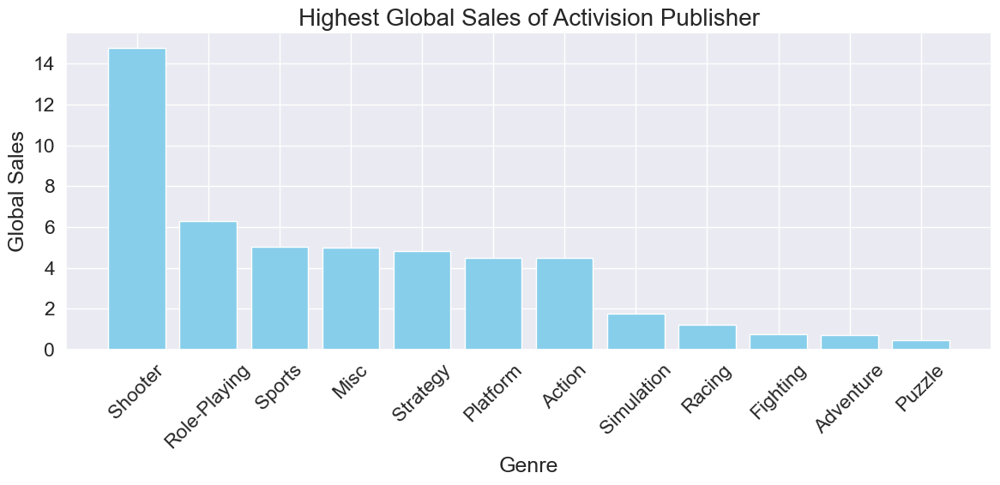

In [318]:
plt.figure(figsize=(12, 6))

## Plot
plt.bar(highest_global_sales['Genre'], highest_global_sales['Global_Sales'], color='skyblue')

## Labels
plt.xlabel('Genre')
plt.ylabel('Global Sales')

## Axis
plt.title('Highest Global Sales of Activision Publisher', size = 20)

## Rotation of axis
plt.xticks(rotation=45)

plt.tight_layout()
##Display of graph
plt.show()

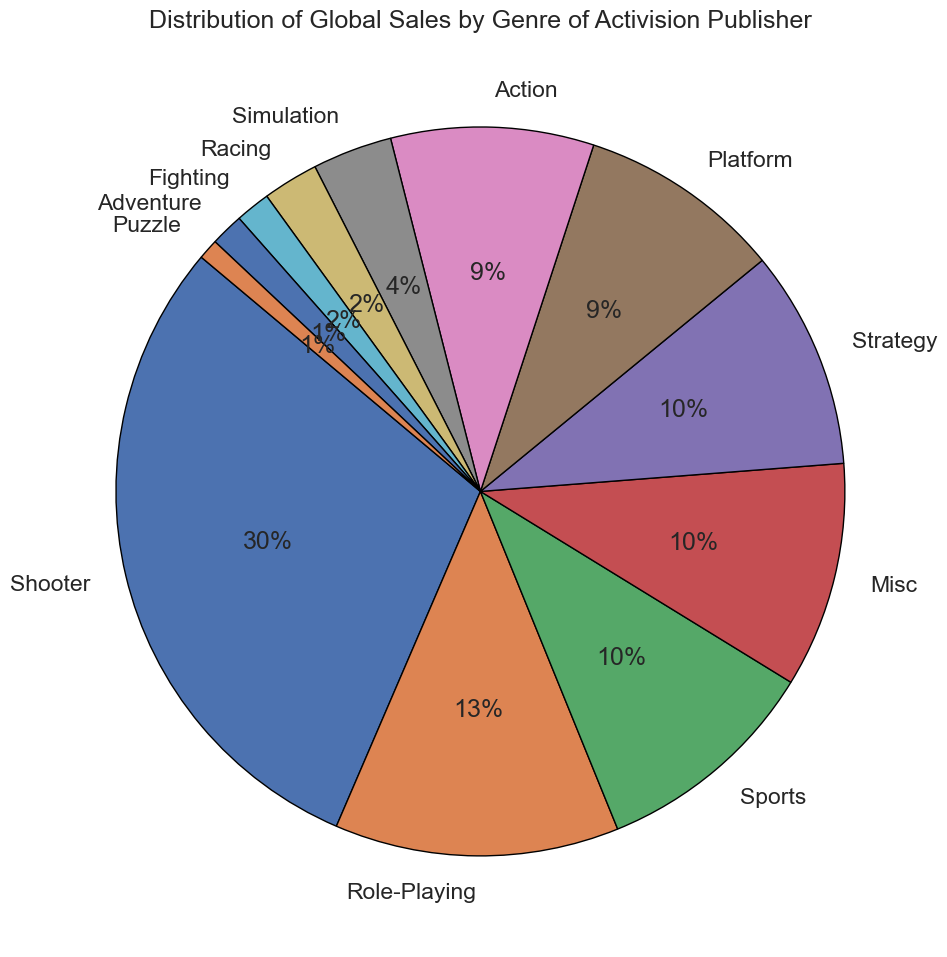

In [319]:
plt.figure(figsize=(10,10))
## plot
plt.pie(highest_global_sales['Global_Sales'], labels=highest_global_sales['Genre'],wedgeprops={"edgecolor": "black"}, autopct='%1.0f%%', startangle=140)
## Title
plt.title('Distribution of Global Sales by Genre of Activision Publisher')

plt.tight_layout()
## Display of Plot
plt.show()

#### In North America Market


In [323]:
## Extract the games with highest NA_Sales
highest_na_sales = Activision_games.groupby('Genre')['NA_Sales'].idxmax()

highest_na_sales = Activision_games.loc[highest_na_sales][['Name', 'Genre', 'NA_Sales']]

highest_na_sales = highest_na_sales.sort_values(by='NA_Sales', ascending=False)

highest_na_sales

,Name,Genre,NA_Sales
31,Call of Duty: Black Ops,Shooter,9.67
239,Pitfall!,Platform,4.21
207,Guitar Hero III: Legends of Rock,Misc,3.49
202,Tony Hawk's Pro Skater,Sports,3.42
241,Spider-Man: The Movie,Action,2.71
288,World of Warcraft: The Burning Crusade,Role-Playing,2.57
217,StarCraft II: Wings of Liberty,Strategy,2.56
2669,Boxing,Fighting,0.72
1622,Vigilante 8,Racing,0.68
2008,ZhuZhu Pets,Simulation,0.68


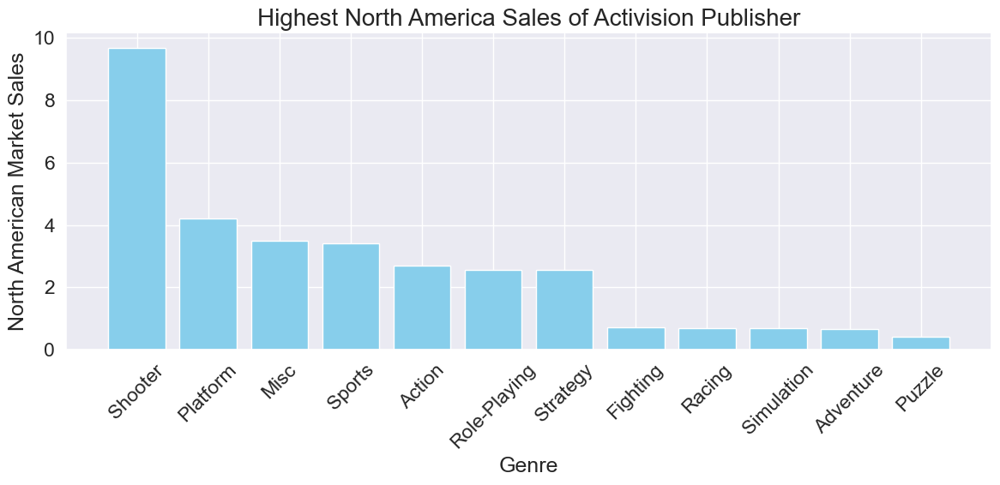

In [325]:
## Plot
plt.figure(figsize=(12, 6))

plt.bar(highest_na_sales['Genre'], highest_na_sales['NA_Sales'], color='skyblue')

## Labels
plt.xlabel('Genre')

plt.ylabel('North American Market Sales')

## Title
plt.title('Highest North America Sales of Activision Publisher', size = 20)

## Rotating the axis
plt.xticks(rotation=45)

plt.tight_layout()

## Display of plot
plt.show()

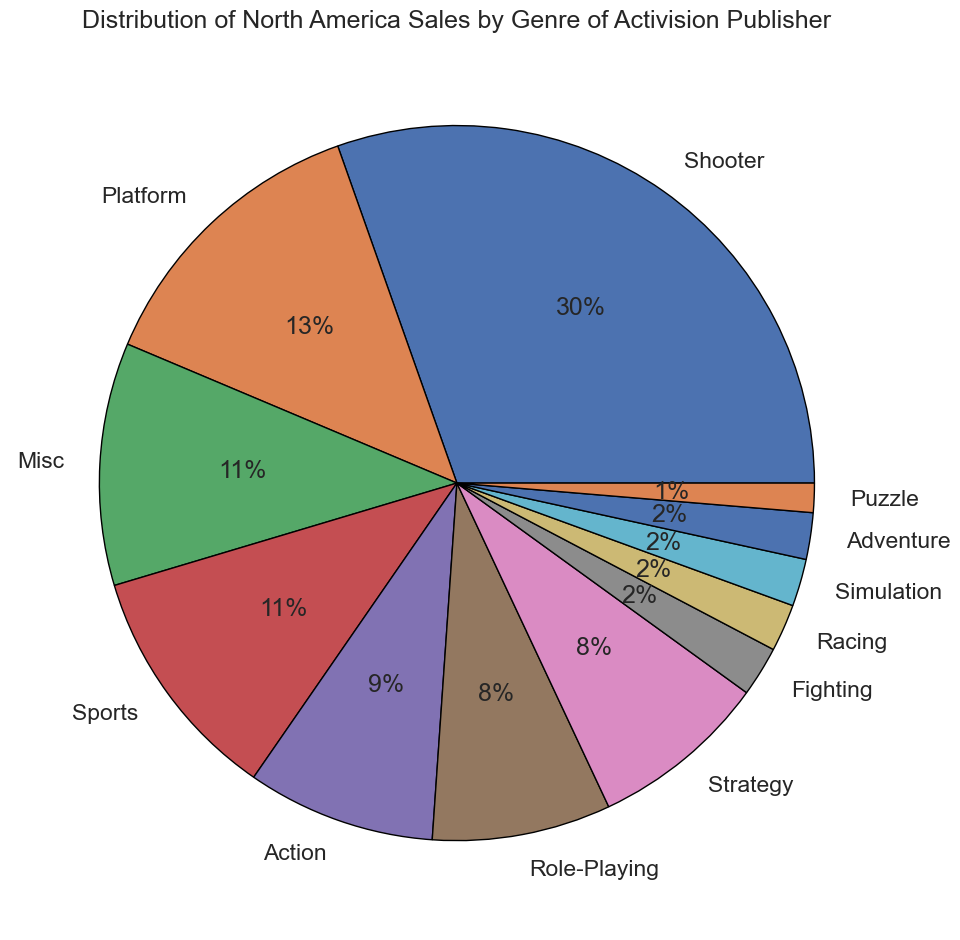

In [327]:
## Plot
plt.figure(figsize=(10,10))

plt.pie(highest_na_sales['NA_Sales'], labels=highest_na_sales['Genre'],wedgeprops={"edgecolor": "black"}, autopct='%1.0f%%')

## Title
plt.title('Distribution of North America Sales by Genre of Activision Publisher')

plt.tight_layout()

## Display of Graph
plt.show()

#### in European Market

In [330]:
## Extract the games with highest EU_Sales
highest_eu_sales = Activision_games.groupby('Genre')['EU_Sales'].idxmax()

highest_eu_sales = Activision_games.loc[highest_eu_sales][['Name', 'Genre', 'EU_Sales']]

highest_eu_sales = highest_eu_sales.sort_values(by='EU_Sales', ascending=False)

highest_eu_sales

,Name,Genre,EU_Sales
137,World of Warcraft,Role-Playing,6.21
34,Call of Duty: Black Ops II,Shooter,5.88
267,Warcraft II: Tides of Darkness,Strategy,2.27
241,Spider-Man: The Movie,Action,1.51
225,Tony Hawk's Pro Skater 2,Sports,1.41
230,Guitar Hero III: Legends of Rock,Misc,1.12
1002,Star Wars: Starfighter,Simulation,0.87
675,Skylanders SWAP Force,Platform,0.83
1622,Vigilante 8,Racing,0.47
2840,X-Men: Mutant Academy 2,Fighting,0.27


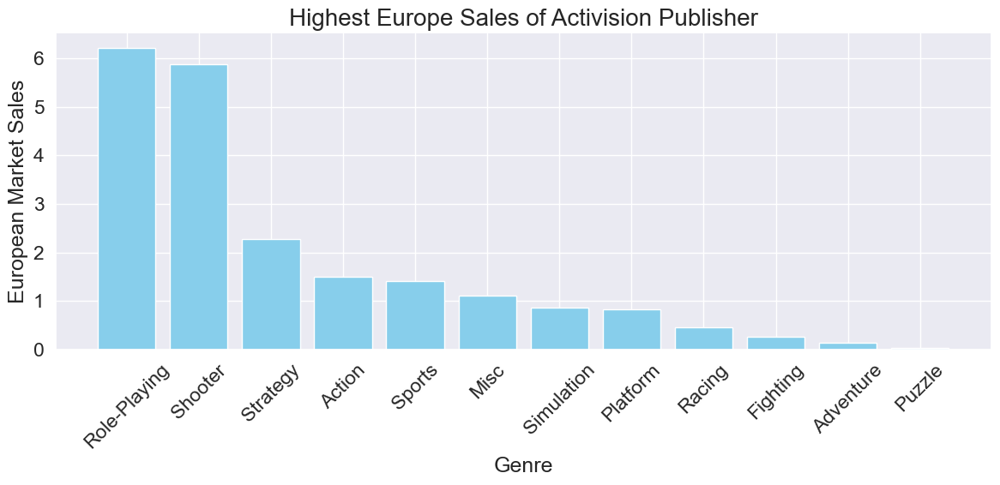

In [332]:
## plot
plt.figure(figsize=(12, 6))

plt.bar(highest_eu_sales['Genre'], highest_eu_sales['EU_Sales'], color='skyblue')

## Labels
plt.xlabel('Genre')
plt.ylabel('European Market Sales')

##Title
plt.title('Highest Europe Sales of Activision Publisher', size = 20)
## Rotation of axis
plt.xticks(rotation=45)

plt.tight_layout()
## Display of Graph
plt.show()

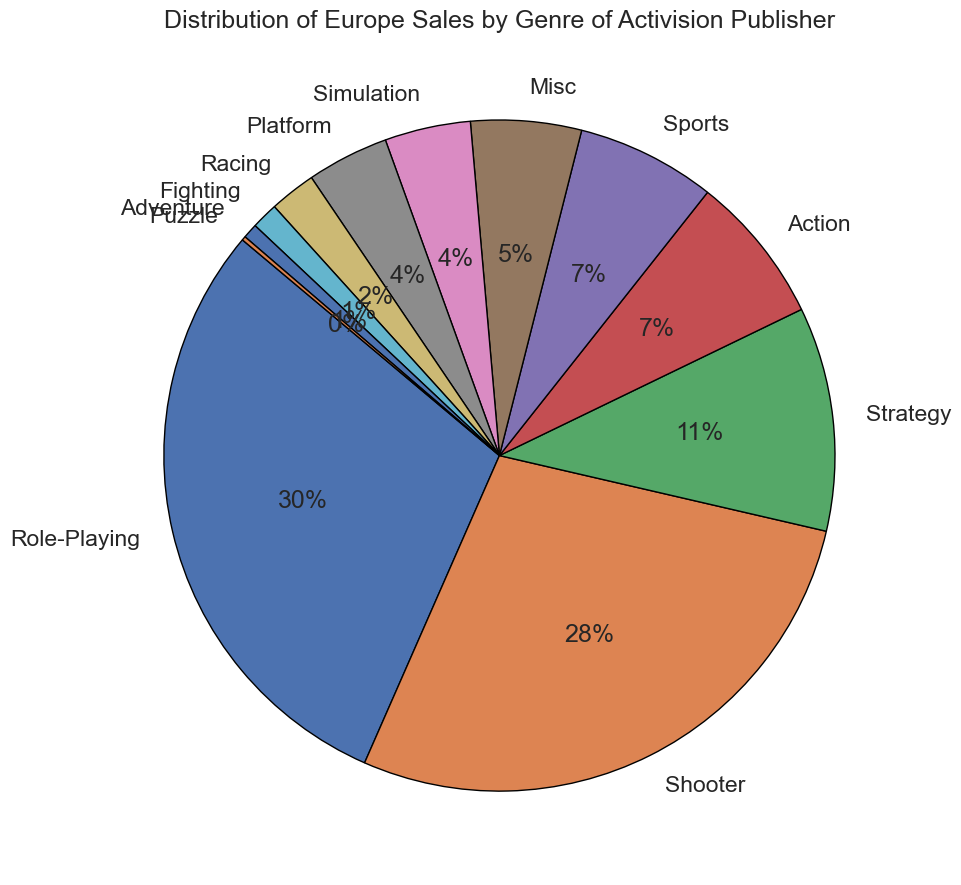

In [334]:
## Plot
plt.figure(figsize=(10,10))

plt.pie(highest_eu_sales['EU_Sales'], labels=highest_eu_sales['Genre'],wedgeprops={"edgecolor": "black"}, autopct='%1.0f%%', startangle=140)

## Title
plt.title('Distribution of Europe Sales by Genre of Activision Publisher')

plt.tight_layout()
## Display of plot
plt.show()

#### in Japan Market

In [337]:
## Extract the games with highest JP_Sales
highest_jp_sales = Activision_games.groupby('Genre')['JP_Sales'].idxmax()

highest_jp_sales = Activision_games.loc[highest_jp_sales][['Name', 'Genre', 'JP_Sales']]

highest_jp_sales = highest_jp_sales.sort_values(by='JP_Sales', ascending=False)

highest_jp_sales

,Name,Genre,JP_Sales
34,Call of Duty: Black Ops II,Shooter,0.65
851,Tenchu: Stealth Assassins,Action,0.27
826,Diablo III,Role-Playing,0.15
10538,Blue Stinger,Adventure,0.10
6663,Bomberman Tournament,Puzzle,0.10
925,Shrek 2,Platform,0.03
710,Guitar Hero III: Legends of Rock,Misc,0.02
2775,Blur,Racing,0.02
1002,Star Wars: Starfighter,Simulation,0.02
202,Tony Hawk's Pro Skater,Sports,0.02


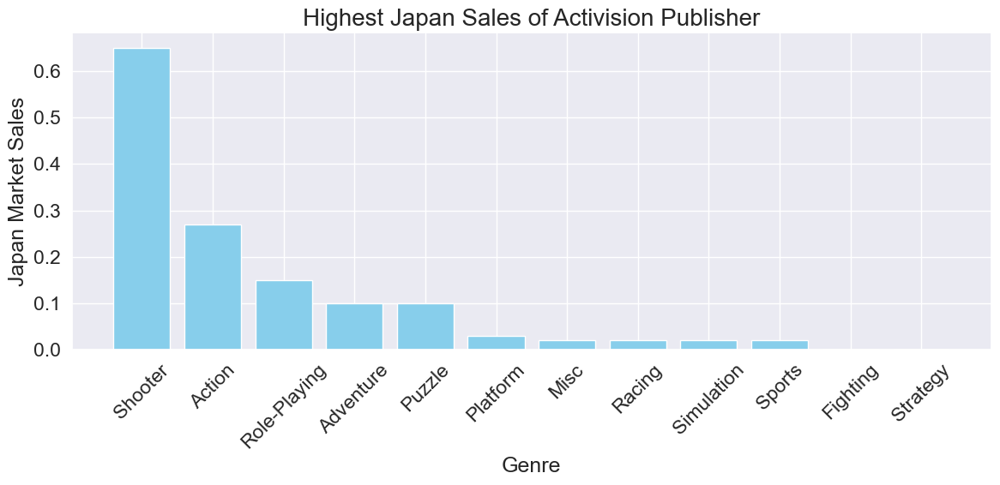

In [339]:
plt.figure(figsize=(12, 6))
## Plot
plt.bar(highest_jp_sales['Genre'], highest_jp_sales['JP_Sales'], color='skyblue')

## Labels
plt.xlabel('Genre')
plt.ylabel('Japan Market Sales')
## Title
plt.title('Highest Japan Sales of Activision Publisher', size = 20)

## Rotation of axis
plt.xticks(rotation=45)

plt.tight_layout()

## Display of plot
plt.show()

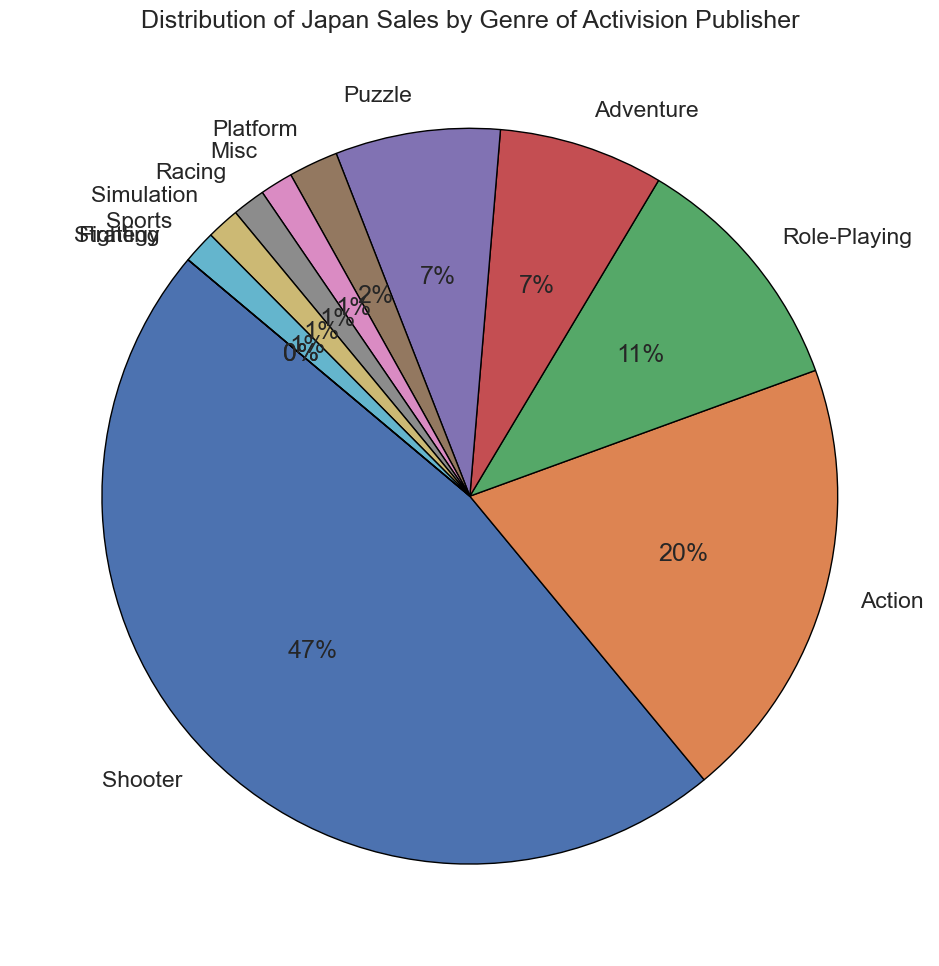

In [340]:
plt.figure(figsize=(10,10))
## Plot
plt.pie(highest_jp_sales['JP_Sales'], labels=highest_jp_sales['Genre'],wedgeprops={"edgecolor": "black"}, autopct='%1.0f%%', startangle=140)
##Title
plt.title('Distribution of Japan Sales by Genre of Activision Publisher')

plt.tight_layout()
##Display of plot
plt.show()

### 19. Top 10 Games by Global Sales

In [344]:
# Top 10 games by global sales
top_games = df.sort_values(by='Global_Sales', ascending=False).head(10)

# Print top 10 games
top_games[['Name', 'Platform', 'Year', 'Genre', 'Publisher', 'Global_Sales']]

,Name,Platform,Year,Genre,Publisher,Global_Sales
0,Wii Sports,Wii,2006.0,Sports,Nintendo,82.74
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,40.24
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,35.82
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,33.00
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,31.37
5,Tetris,GB,1989.0,Puzzle,Nintendo,30.26
6,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,30.01
7,Wii Play,Wii,2006.0,Misc,Nintendo,29.02
8,New Super Mario Bros. Wii,Wii,2009.0,Platform,Nintendo,28.62
9,Duck Hunt,NES,1984.0,Shooter,Nintendo,28.31


### 🌟 Nintendo's Global Dominance in Video Games 🌟

---

#### **1️⃣ Nintendo’s Success in Global Sales**:
- **Nintendo** is the **most successful publisher** worldwide, having published **all of the top 10 games** in the table.
- These games collectively account for a staggering **369.37 million units sold globally**.

---

#### **2️⃣ Most Popular Genres**:
- **Sports** and **Platform** are the leading genres:
  - **Wii Sports** is the best-selling game in the **Sports genre**.
  - **Super Mario Bros.** leads as the best-seller in the **Platform genre**.

---

#### **3️⃣ Most Popular Platforms**:
- The top platforms associated with these best-selling games are:
  - **Wii** and **NES**, with **four games each** in the top 10 list.

---

### 🎮 Key Takeaway:
Nintendo's legacy as a trailblazer in the gaming world is unmatched, with its iconic titles and platforms cementing its place as a global leader. From **Wii Sports** to **Super Mario Bros.**, the company continues to shape the industry's history. 🚀✨🎮

### 20 . Most Popular Games Trend

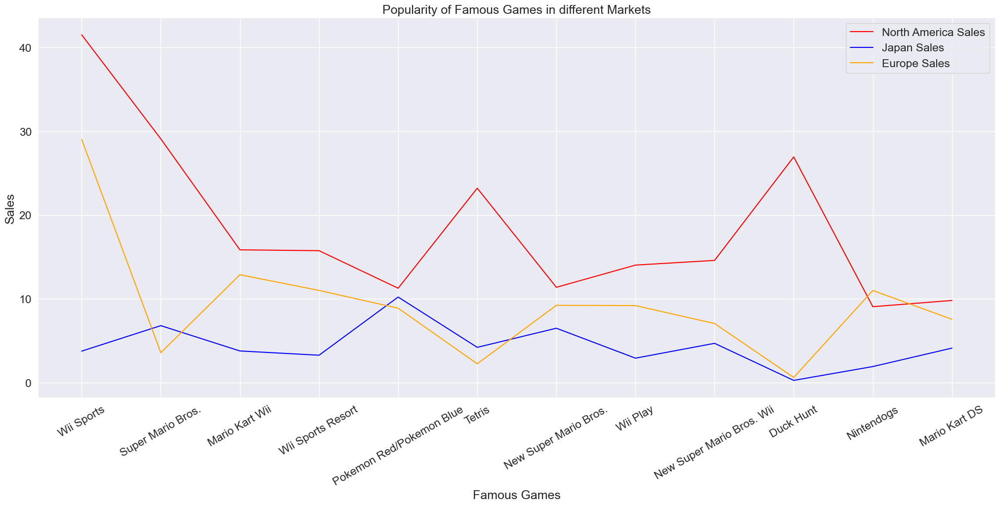

In [348]:
fig = plt.figure(figsize=(25,10))
plt.plot(df['Name'].head(12), df['NA_Sales'].head(12), color='red', label='North America Sales')
plt.plot(df['Name'].head(12), df['JP_Sales'].head(12), color ='blue', label='Japan Sales')
plt.plot(df['Name'].head(12), df['EU_Sales'].head(12), color='orange', label='Europe Sales')
plt.legend()
plt.xlabel('Famous Games')
plt.xticks(rotation=30)
plt.ylabel('Sales')
plt.title('Popularity of Famous Games in different Markets')
plt.show()

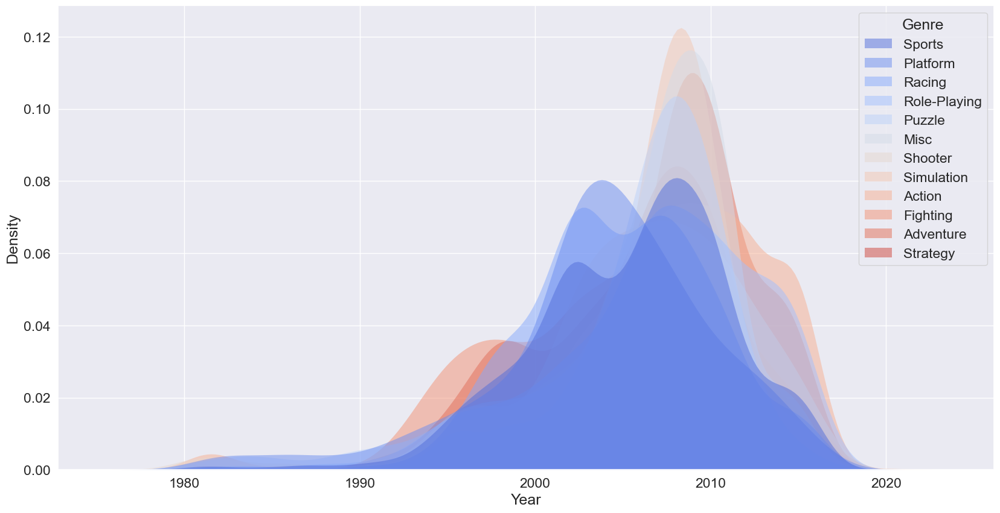

In [350]:
plt.figure(figsize=(20,10))
sns.kdeplot( data=df,  x='Year',hue="Genre", fill=True, common_norm=False,palette='coolwarm' , alpha=.5, linewidth=0,legend=True)
plt.show()

### 🎮 Evolution of Video Game Genres Over the Decades 🎮

---

#### **1980s to 1990s**:
- The most popular genres during this time were:
  - **Sports**
  - **Racing**
  - **Action**
  - **Shooter**

---

#### **1990s to 2000s**:
- All genres experienced **growth**, with increasing popularity in:
  - **Adventure**
  - **Platform**

---

#### **2000s to 2010s**:
- This period saw genres reaching their **peak popularity**, including:
  - **Puzzle**
  - **Action**
  - **Simulation**
  - **Fighting**
  - **Miscellaneous**

---

#### **2010s to 2020**:
- A general **decline** in all genres was observed, but:
  - **Action** and **Role-Playing** remained the **most dominant**, even as they declined.

---

### 🌟 Key Observations:
- The 2000s to 2010s represent the **golden age** of genre diversity, where almost every genre thrived.
- The **2010s to 2020s** reflect a shifting industry landscape, with fewer genre-driven trends but continued dominance of iconic genres like **Action** and **Role-Playing**.

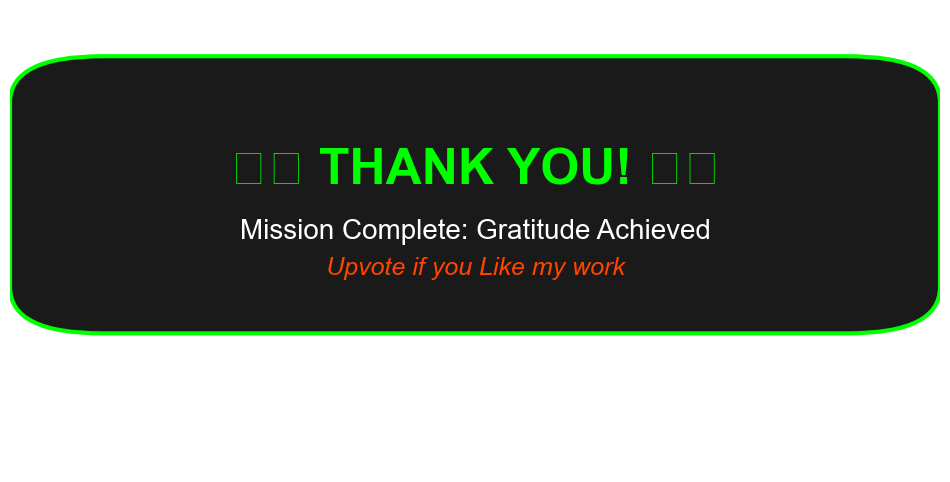

In [393]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# Create the figure and axis
plt.figure(figsize=(12, 6))
plt.gca().set_facecolor('#000000')  # Black background for arcade vibes
plt.axis('off')  # Hide axes

# Add a glowing retro-style rectangle
box = FancyBboxPatch((0.1, 0.4), 0.8, 0.4, boxstyle="round,pad=0.1",
                      edgecolor='#00FF00', facecolor='#1a1a1a', linewidth=3)
plt.gca().add_patch(box)

# Add arcade-style text
plt.text(
    0.5, 0.65, 
    "🕹️ THANK YOU! 🕹️", 
    color='#00FF00', fontsize=36, fontweight='bold',
    ha='center', va='center'
)

plt.text(
    0.5, 0.52, 
    "Mission Complete: Gratitude Achieved", 
    color='#FFFFFF', fontsize=20, ha='center', va='center'
)

plt.text(
    0.5, 0.44, 
    "Upvote if you Like my work", 
    color='#FF4500', fontsize=18, ha='center', va='center', fontstyle='italic'
)

# Display pixelated retro design
plt.show()

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
✨ QUEST COMPLETE: THANK YOU! ✨

🏆 You've Earned:
- Legendary Title: Data Wizard 🧙‍♂️
- Achievement: Supporter Extraordinaire 🌟
- Bonus Reward: Unlimited Gratitude 💎

🗺️ The Journey Continues… Prepare for the Next Adventure!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~